In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER
import cftime
import datetime
from datetime import date
from matplotlib import pyplot
from matplotlib import colors
from matplotlib import font_manager
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from mpl_toolkits.mplot3d import Axes3D
import netCDF4
import numpy
import os
import pandas
from PIL import Image
import random
import readline
import scipy
from scipy import fft
from scipy import linalg
from scipy import stats
from scipy.stats import poisson, ttest_ind
import seaborn
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import normalize
from statsmodels.tsa.ar_model import AutoReg
import xarray as xr

In [2]:
Diri = '/glade/u/home/whimkao//ExtraTrack/Output_Files/'

In [3]:
# Open File
def Open_File(File):
    DF = pandas.read_csv(File)
    DF = DF.drop("Unnamed: 0", axis=1)
    return (DF)

In [4]:
# Open Each File
def Files_Open(Model, Diri):
    Data_DF = Open_File(Diri+Model+'_Data_Output_V3.csv')
    ET_DF = Open_File(Diri+Model+'_ET_Output_V3.csv')
    Codes_DF = Open_File(Diri+Model+'_Codes_Output_V3.csv')
    Time = []
    Start_Time = []
    End_Time = []
    for i in range(len(Data_DF)):
        Time.append(Datetime(Data_DF["Time(Z)"][i]))
    for j in range(len(ET_DF)):
        Start_Time.append(Datetime(ET_DF["Start Time"][j]))
        End_Time.append(Datetime(ET_DF["End Time"][j]))
    Data_DF["Time(Z)"] = Time
    ET_DF["Start Time"] = Start_Time
    ET_DF["End Time"] = End_Time
    return (Data_DF, ET_DF, Codes_DF)

In [5]:
def Datetime(Time):
    New_Time = datetime.datetime.strptime(Time, '%Y-%m-%d %H:%M:%S')
    return (New_Time)

In [6]:
Control_Data, Control_ET, Control_Codes = Files_Open("Control", Diri)
RCP45_Data, RCP45_ET, RCP45_Codes = Files_Open("RCP45", Diri)
RCP85_Data, RCP85_ET, RCP85_Codes = Files_Open("RCP85", Diri)

In [7]:
Control_Data[265:277]

,Code,Name,Lon,Lat,SLP(hPa),Winds(m/s),B,VLT,VUT,Time(Z),Storm Phase
265,TC190105,Lydia,-56.33,37.40,948.48,41.5,9.05,236.10,289.92,1901-09-27 00:00:00,Tropical
266,TC190105,Lydia,-54.83,38.25,950.98,39.9,11.90,234.39,267.61,1901-09-27 06:00:00,Tropical
267,TC190105,Lydia,-53.37,39.19,953.76,43.1,18.13,224.89,230.05,1901-09-27 12:00:00,Transition
268,TC190105,Lydia,-51.56,40.08,952.91,42.0,31.98,231.25,195.68,1901-09-27 18:00:00,Transition
269,TC190105,Lydia,-49.70,42.10,951.29,38.4,43.81,253.98,172.97,1901-09-28 00:00:00,Transition
270,TC190105,Lydia,-49.51,44.55,948.89,44.0,41.29,241.12,161.34,1901-09-28 06:00:00,Transition
271,TC190105,Lydia,-49.52,44.98,949.44,43.2,38.45,220.08,156.22,1901-09-28 12:00:00,Transition
272,TC190105,Lydia,-48.37,45.66,952.82,37.7,28.80,201.31,169.85,1901-09-28 18:00:00,Transition
273,TC190105,Lydia,-47.67,46.28,959.65,33.9,14.50,153.80,168.18,1901-09-29 00:00:00,Transition
274,TC190105,Lydia,-46.92,46.83,963.87,31.0,4.41,76.01,151.33,1901-09-29 06:00:00,Transition


In [8]:
Control_ET[5:8]

,Code,Name,Path Type,Start Time,End Time,Min SLP,Start SLP,End SLP,Start Lon,Start Lat,End Lon,End Lat,ET Dist (km),ET Duration (hr),Trop Duration (hr)
5,TC190105,Lydia,1,1901-09-27 12:00:00,1901-09-29 18:00:00,913.33,953.76,970.00,-53.37,39.19,-42.82,48.53,1335.846025,54.0,384.0
6,TC190106,Mario,1,1901-09-22 00:00:00,1901-09-22 18:00:00,988.80,993.69,991.98,-78.47,35.78,-71.20,41.68,909.539822,18.0,72.0
7,TC190107,Nicole,2,1901-10-14 12:00:00,1901-10-15 00:00:00,974.56,1015.94,1019.52,-22.00,42.00,-26.00,41.25,343.074813,12.0,246.0


In [9]:
Control_Codes[5:8]

,ABC,Orig Code,New Code,Name
5,A,89,TC190105,Lydia
6,A,90,TC190106,Mario
7,A,95,TC190107,Nicole


In [10]:
# Define Cyclone Type, Set Shape and Colour Code
SLP_Colours = ['darkviolet', 'mediumvioletred', 'magenta', 'red', 'orangered', \
'darkorange', 'orange', 'gold', 'yellow', 'greenyellow', 'limegreen', 'deepskyblue', 'cyan']
SLP_Bounds = numpy.arange(900,1020,10)
#SLP_Bounds = numpy.array([900,910,920,930,940,950,960,970,980,990,1000,1005,1010])
#SLP_Colour_Labels = ['>1010hPa', '1005-1010hPa', '1000-1005hPa', '995-1000hPa', '990-995hPa', \
#'985-990hPa', '980-985hPa', '975-980hPa', '970-975hPa', '965-970hPa', '960-965hPa', \
#'955-960hPa', '950-955hPa', '945-950hPa', '940-945hPa', '935-940hPa', '930-935hPa', '<=930hPa'].reverse()
def Cyclone_Type(DF, ET_DF, Storm_List):
# Cyclone Type and Shape Code
    Cyclone_Type = []
    Plot_Shape = []
    for i in range(len(DF["Storm Phase"])):
        if DF["Storm Phase"][i] == "Tropical":
            Plot_Shape.append('o')
        elif DF["Storm Phase"][i] == "Transition":
            Plot_Shape.append('s')
        elif DF["Storm Phase"][i] == "Extratropical":
            Plot_Shape.append('^')
        else:
            print (DF["Storm Type"][i])
    DF["Plot Shape"] = Plot_Shape
#    
# SLP Colour Code
    Plot_Colour = []
    for i in range(len(DF["SLP(hPa)"])):
        for k in range(len(SLP_Colours)):
            if k == 0:
                if DF["SLP(hPa)"][i] <= SLP_Bounds[k]:
                    Plot_Colour.append(SLP_Colours[k])
            elif k != len(SLP_Colours)-1:
                if DF["SLP(hPa)"][i] <= SLP_Bounds[k] and DF["SLP(hPa)"][i] > SLP_Bounds[k-1]:
                    Plot_Colour.append(SLP_Colours[k])
            else:
                if DF["SLP(hPa)"][i] > SLP_Bounds[k-1]:
                    Plot_Colour.append(SLP_Colours[k])
    DF["Plot Colour"] = Plot_Colour
    return (DF)

In [11]:
Control_Data_Plot = Cyclone_Type(Control_Data, Control_ET, Control_Codes["New Code"])
RCP45_Data_Plot = Cyclone_Type(RCP45_Data, RCP45_ET, RCP45_Codes["New Code"])
RCP85_Data_Plot = Cyclone_Type(RCP85_Data, RCP85_ET, RCP85_Codes["New Code"])

In [12]:
# Create Legend
def Plot_TC_Legend(Loc):
    pyplot.scatter([-728], [-728], c='cyan', marker='o', linewidths=0.8, edgecolors='black', label='Tropical')
    pyplot.scatter([-728], [-728], c='cyan', marker='s', linewidths=0.8, edgecolors='black', label='Transition')
    pyplot.scatter([-728], [-728], c='cyan', marker='^', linewidths=0.8, edgecolors='black', label='Extratropical')
    pyplot.legend(loc=Loc, fontsize=12)

In [13]:
# Plot Cyclone Track
def Plot_Cyclone_Track(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig, Figsize):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    Lon = numpy.array(DF_Storm['Lon'])
    Lat = numpy.array(DF_Storm['Lat'])
    Plot_Colour = list(DF_Storm['Plot Colour'])
    Plot_Shape = list(DF_Storm['Plot Shape'])
#
# Plotting
    Fig = pyplot.figure(figsize=Figsize)
    Axis = Fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    Axis.coastlines(linewidth=0.5)
    Axis.add_feature(cfeature.BORDERS, linewidth=0.5)
    Axis.add_feature(cfeature.STATES, linewidth=0.3)
    Axis.plot(Lon, Lat, c='black', linewidth=0.5, alpha=0.8)
    for k in range(len(Lon)):
#        if Plot_Shape[k] != 's':
        pyplot.scatter(Lon[k], Lat[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
#        else:
#            pyplot.scatter(Lon[k], Lat[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        pyplot.scatter(ET_Storm["Start Lon"][0], ET_Storm["Start Lat"][0], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(ET_Storm["End Lon"][0], ET_Storm["End Lat"][0]+0.1, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
#
# Formatting
    x_Min = (int(round((numpy.min(Lon)+1.5) / 5)) - 1) * 5
    x_Max = (int(round((numpy.max(Lon)-1.5) / 5)) + 1) * 5
    y_Min = (int(round((numpy.min(Lat)+1.5) / 5)) - 1) * 5
    y_Max = (int(round((numpy.max(Lat)-1.5) / 5)) + 1) * 5
    x_Axis = numpy.arange(x_Min,x_Max+5,5)
    y_Axis = numpy.arange(y_Min,y_Max+5,5)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    Axis.set_xlim(x_Min,x_Max)
    Axis.set_ylim(y_Min,y_Max)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=16)
    Gridline = Axis.gridlines(crs=ccrs.PlateCarree(), linewidth=0.3, color='silver', linestyle='-')
    Gridline.xlocator = mticker.FixedLocator(x_Axis)
    Gridline.ylocator = mticker.FixedLocator(y_Axis)
#
# Colour Bar
    C_Map = mcolors.LinearSegmentedColormap.from_list("SLP(hPa)", Colours, N=len(Colours))
    Norm = mcolors.BoundaryNorm(Bounds, C_Map.N, extend='both')
    Cax = Axis.inset_axes([0.025, -0.12, 0.95, 0.05], transform=Axis.transAxes)
    Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', spacing='proportional', \
    cax=Cax, label='SLP(hPa)', shrink=0.7)
    Plot_TC_Legend(Loc)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_Track.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V3/'+Figname, bbox_inches='tight')

In [14]:
# Plot Cyclone SLP
def Plot_Cyclone_SLP(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    Time = list(DF_Storm['Time(Z)'])
    SLP = numpy.array(DF_Storm['SLP(hPa)'])
    Plot_Colour = list(DF_Storm['Plot Colour'])
    Plot_Shape = list(DF_Storm['Plot Shape'])
#
# Plotting
    Fig = pyplot.figure(figsize=(12,7))
    Axis = Fig.add_subplot(1,1,1)
    Axis.plot(Time, SLP, c='black', linewidth=0.5, alpha=0.8)
    for k in range(len(Time)):
        Axis.scatter(Time[k], SLP[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.8, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        pyplot.scatter(ET_Storm["Start Time"][0], ET_Storm["Start SLP"][0], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(ET_Storm["End Time"][0], ET_Storm["End SLP"][0]+0.2, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
#
# Formatting
    pyplot.xlabel('Time (Z)', fontsize=12)
    pyplot.ylabel('Sea Level Pressure (SLP)', fontsize=12)
    x_Min = Time[0] + datetime.timedelta(hours=-6)
    x_Max = Time[len(Time)-1] + datetime.timedelta(hours=6)
    x_Start = datetime.date(x_Min.year,x_Min.month,x_Min.day) + datetime.timedelta(1)
    x_End = datetime.date(x_Max.year,x_Max.month,x_Max.day) + datetime.timedelta(1)
    if len(Time) < 40:
        x_Axis = pandas.date_range(x_Start,x_End,freq='D')
    elif len(Time) < 80:
        x_Axis = pandas.date_range(x_Start,x_End,freq='2D')
    else:
        x_Axis = pandas.date_range(x_Start,x_End,freq='3D')
    y_Min = (int(round(numpy.min(SLP) / 5)) - 1) * 5
    y_Max = (int(round(numpy.max(SLP) / 5)) + 1) * 5
    if y_Max - y_Min < 60:
        y_Axis = numpy.arange(y_Min,y_Max+5,5)
    else:
        if y_Min % 10 == 0:
            y_Axis = numpy.arange(y_Min,y_Max+10,10)
        else:
            y_Axis = numpy.arange(y_Min-5,y_Max+15,10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    Axis.set_xlim(x_Min,x_Max)
    Axis.set_ylim(y_Min,y_Max)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=16)
    Gridline = Axis.grid(linewidth=0.3, color='silver', linestyle='-')
    Plot_TC_Legend(Loc)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_SLP.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V3/'+Figname, bbox_inches='tight')

In [15]:
# Plot Cyclone Phase Diagram
def Plot_Cyclone_Phase(Storm_Code, DF, ET_DF, Bounds, Colours, Loc, Trans, Model, Savefig):
    DF_Storm = DF[DF['Code'] == Storm_Code].reset_index()
    VLT = numpy.array(DF_Storm['VLT'])[1:]
    VUT = numpy.array(DF_Storm['VUT'])[1:]
    B = numpy.array(DF_Storm['B'])[1:]
    Plot_Colour = list(DF_Storm['Plot Colour'])[1:]
    Plot_Shape = list(DF_Storm['Plot Shape'])[1:]
#
# Plotting VUT VLT
    Fig = pyplot.figure(figsize=(16,8))
    Axis = Fig.add_subplot(1,2,1)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-30,130,10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-30,120)
    pyplot.fill_between([0,500], 15, 120, color='violet', alpha=0.2)
    pyplot.fill_between([-500,0], 15, 120, color='mediumblue', alpha=0.2)
    pyplot.fill_between([0,500], -30, 15, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], -30, 15, color='darkgrey', alpha=0.2)
    pyplot.plot([-500,500], [15,15], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-30,120], 'black', linewidth=0.5)
    pyplot.xlabel('VLT', fontsize=12)
    pyplot.ylabel('B', fontsize=12)
    Axis.plot(VLT, B, c='black', linewidth=0.5, alpha=0.5)
    for k in range(len(VLT)):
        Axis.scatter(VLT[k], B[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        Start_Time = ET_Storm["Start Time"][0]
        End_Time = ET_Storm["End Time"][0]
        Start_DF = DF_Storm[DF_Storm["Time(Z)"] == Start_Time]
        End_DF = DF_Storm[DF_Storm["Time(Z)"] == End_Time]
#        print (Start_DF)
        pyplot.scatter(Start_DF["VLT"], Start_DF["B"], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(End_DF["VLT"], End_DF["B"]+0.5, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
    Title = str(Model + ': ' + DF_Storm['Code'][0] + ' ' + DF_Storm['Name'][0])
    Axis.set_title(Title, fontsize=18)
    Plot_TC_Legend(Loc)
#
# Plotting VUT VLT
    Axis = Fig.add_subplot(1,2,2)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-500,600,100)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-500,500)
    pyplot.fill_between([0,500], 500, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], 500, color='lightskyblue', alpha=0.2)
    pyplot.fill_between([0,500], -500, color='orangered', alpha=0.2)
    pyplot.fill_between([-500,0], -500, color='mediumblue', alpha=0.2)
    pyplot.plot([-500,500], [0,0], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-500,500], 'black', linewidth=0.5)
    pyplot.xlabel('VLT', fontsize=12)
    pyplot.ylabel('VUT', fontsize=12)
    Axis.plot(VLT, VUT, c='black', linewidth=0.5, alpha=0.5)
    for k in range(len(VLT)):
        Axis.scatter(VLT[k], VUT[k], c=Plot_Colour[k], marker=Plot_Shape[k], linewidths=0.5, edgecolors='black', s=78)
    if Trans == True:
        ET_Storm = ET_DF[ET_DF["Code"] == Storm_Code].reset_index()
        Start_Time = ET_Storm["Start Time"][0]
        End_Time = ET_Storm["End Time"][0]
        Start_DF = DF_Storm[DF_Storm["Time(Z)"] == Start_Time]
        End_DF = DF_Storm[DF_Storm["Time(Z)"] == End_Time]
        pyplot.scatter(Start_DF["VLT"], Start_DF["VUT"], marker='s', linewidths=4.8, \
        facecolors='none', edgecolors='black', s=178)
        pyplot.scatter(End_DF["VLT"], End_DF["VUT"]+0.5, marker='^', linewidths=4.2, \
        facecolors='none', edgecolors='black', s=208)
    Axis.set_title(Title, fontsize=18)
#
# Colour Bar
    C_Map = mcolors.LinearSegmentedColormap.from_list("SLP(hPa)", Colours, N=len(Colours))
    Norm = mcolors.BoundaryNorm(Bounds, C_Map.N, extend='both')
    Cax = Axis.inset_axes([-0.75, -0.15, 1.3, 0.05], transform=Axis.transAxes)
    Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', spacing='proportional', \
    cax=Cax, label='SLP(hPa)', shrink=0.7)
#
# Save Fig
    if Savefig == True:
        Figname = str(DF_Storm['Code'][0] + '_' + DF_Storm['Name'][0] + '_Phase.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V3/'+Figname, bbox_inches='tight')

In [16]:
# Plot Cyclone Phase Diagram
def Cyclone_Phase_Base(Savefig):
# Plotting VUT VLT
    Fig = pyplot.figure(figsize=(16,8))
    Axis = Fig.add_subplot(1,2,1)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-30,130,10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-30,120)
    pyplot.fill_between([0,500], 15, 120, color='violet', alpha=0.2)
    pyplot.fill_between([-500,0], 15, 120, color='mediumblue', alpha=0.2)
    pyplot.fill_between([0,500], -30, 15, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], -30, 15, color='darkgrey', alpha=0.2)
    pyplot.plot([-500,500], [15,15], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-30,120], 'black', linewidth=0.5)
    pyplot.xlabel('VLT (900-600hPa Thermal Wind)', fontsize=12)
    pyplot.ylabel('B (900-600hPa Storm-Relative Thickness Symmetry)', fontsize=12)
# Label Quadrants
    Axis.text(250, -15, "SYMMETRIC", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, -25, "WARM CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, 90, "ASYMMETRIC", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, 80, "WARM CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, 90, "ASYMMETRIC", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, 80, "COLD CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, -15, "SYMMETRIC", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, -25, "COLD CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
#
# Plotting VUT VLT
    Axis = Fig.add_subplot(1,2,2)
    x_Axis = numpy.arange(-500,600,100)
    y_Axis = numpy.arange(-500,600,100)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    pyplot.xlim(-500,500)
    pyplot.ylim(-500,500)
    pyplot.fill_between([0,500], 500, color='red', alpha=0.2)
    pyplot.fill_between([-500,0], 500, color='lightskyblue', alpha=0.2)
    pyplot.fill_between([0,500], -500, color='orangered', alpha=0.2)
    pyplot.fill_between([-500,0], -500, color='mediumblue', alpha=0.2)
    pyplot.plot([-500,500], [0,0], 'black', linewidth=0.5)
    pyplot.plot([0,0], [-500,500], 'black', linewidth=0.5)
    pyplot.xlabel('VLT (900-600hPa Thermal Wind)', fontsize=12)
    pyplot.ylabel('VUT (600-300hPa Thermal Wind)', fontsize=12)
# Label Quadrants
    Axis.text(250, 400, "DEEP", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, 330, "WARM CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, -330, "SHALLOW", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(250, -400, "WARM CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, -330, "DEEP", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, -400, "COLD CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, 400, "SHALLOW", ha='center', va='center', \
    fontdict={'size':28}, color='black')
    Axis.text(-250, 330, "COLD CORE", ha='center', va='center', \
    fontdict={'size':28}, color='black')
#
# Save Fig
    if Savefig == True:
        Figname = str('Phase_Space_Base.png')
        Fig.savefig('/glade/u/home/whimkao//ExtraTrack/Storm_Figs_V3/'+Figname, bbox_inches='tight')

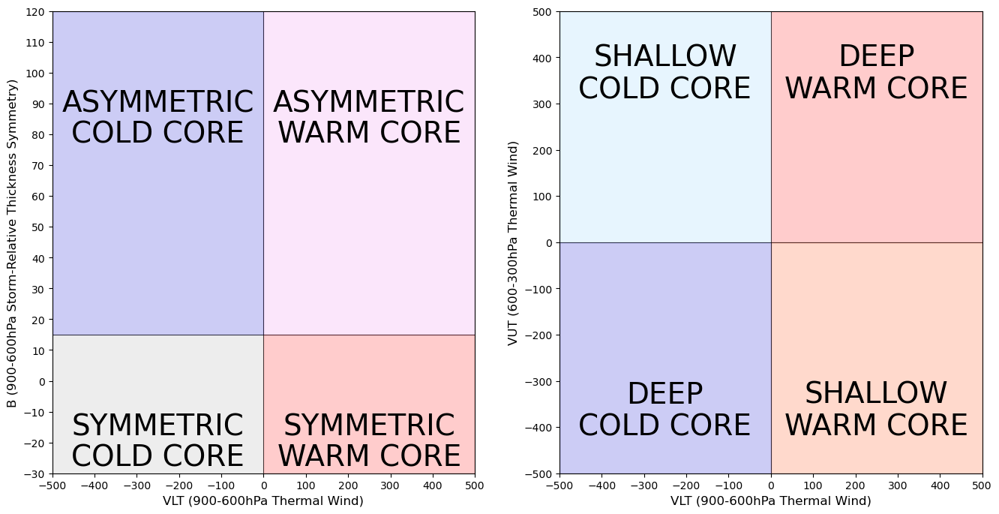

In [17]:
Cyclone_Phase_Base(False)

In [18]:
# Plot Some Cyclone Tracks, SLP and Phase Plots

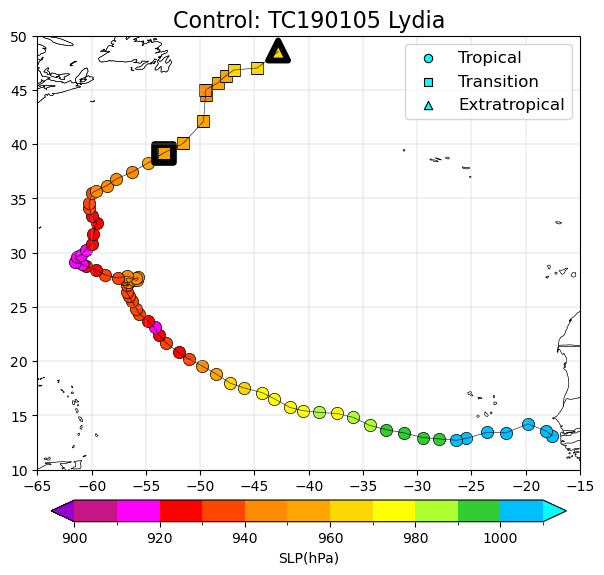

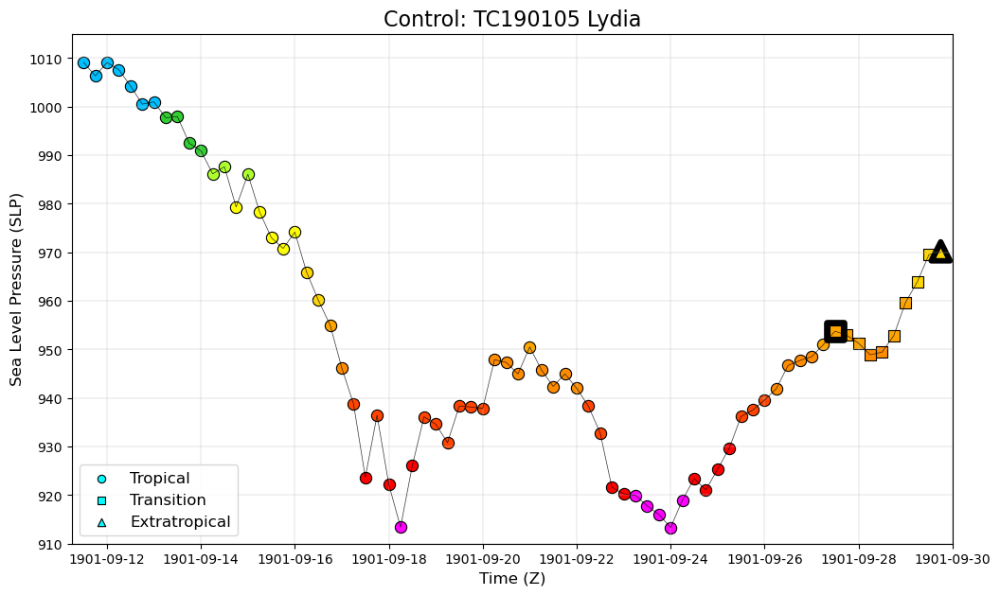

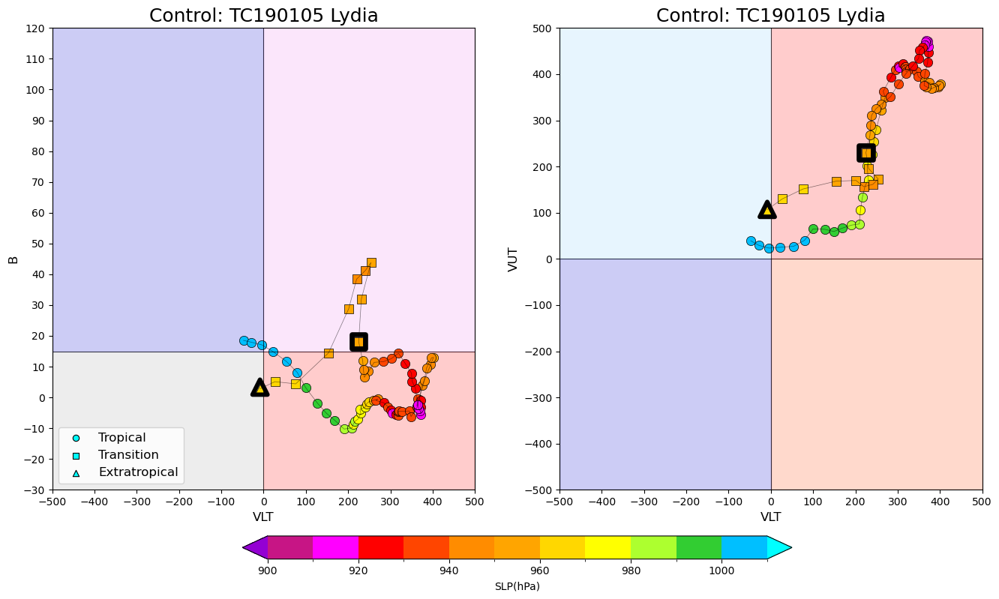

In [19]:
# Input Code
Code = 'TC190105'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

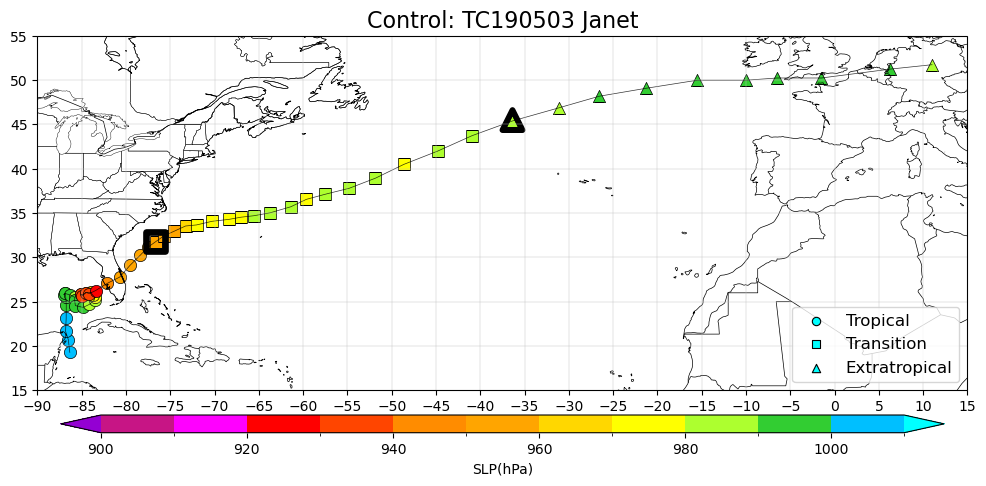

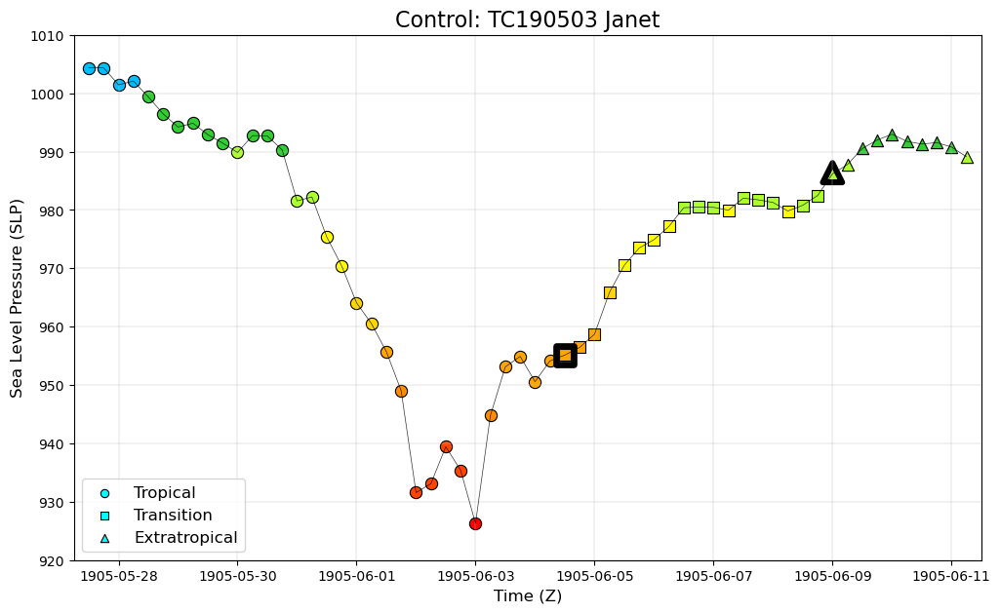

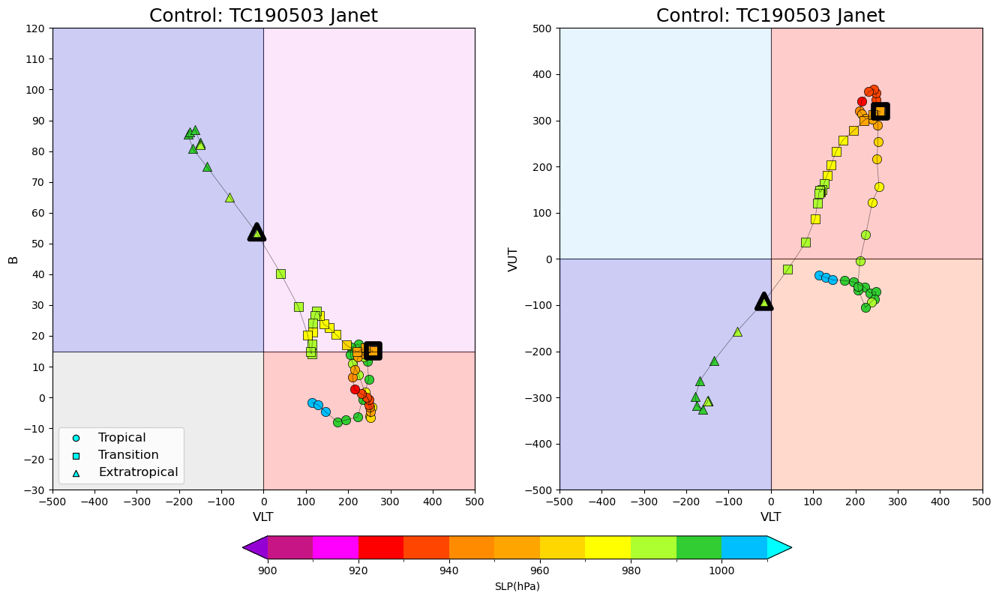

In [20]:
# Input Code
Code = 'TC190503'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", True, (12,5))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

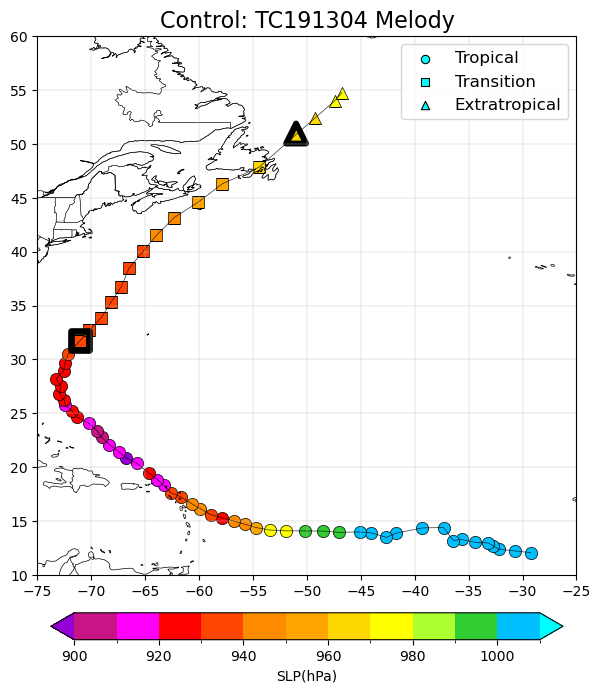

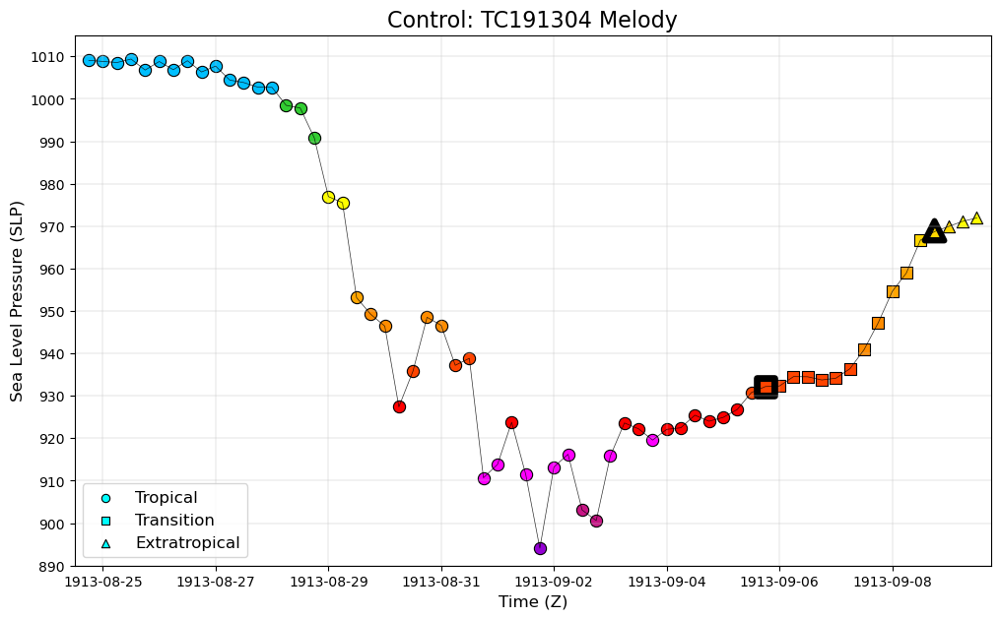

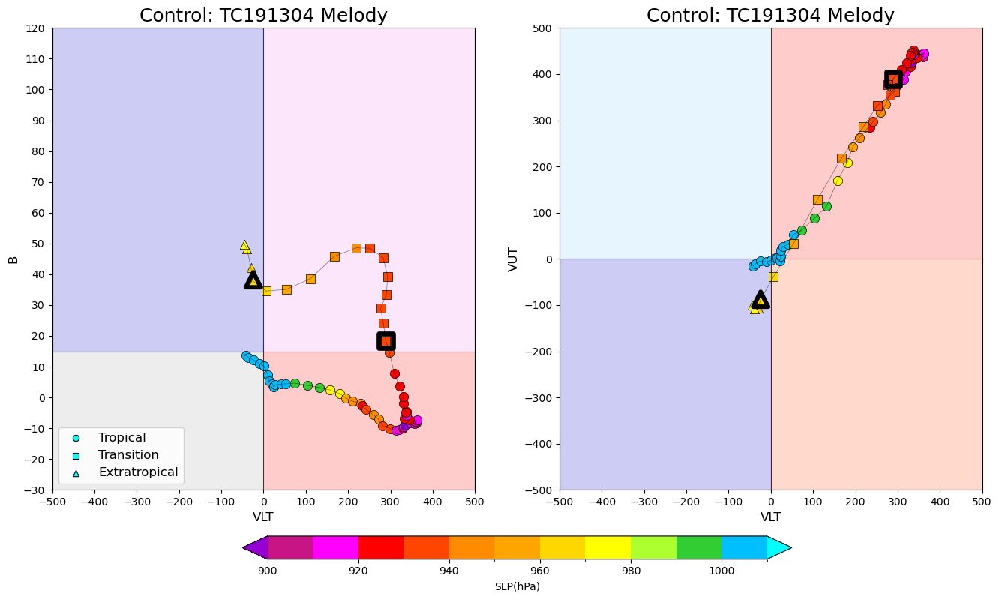

In [21]:
# Input Code
Code = 'TC191304'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

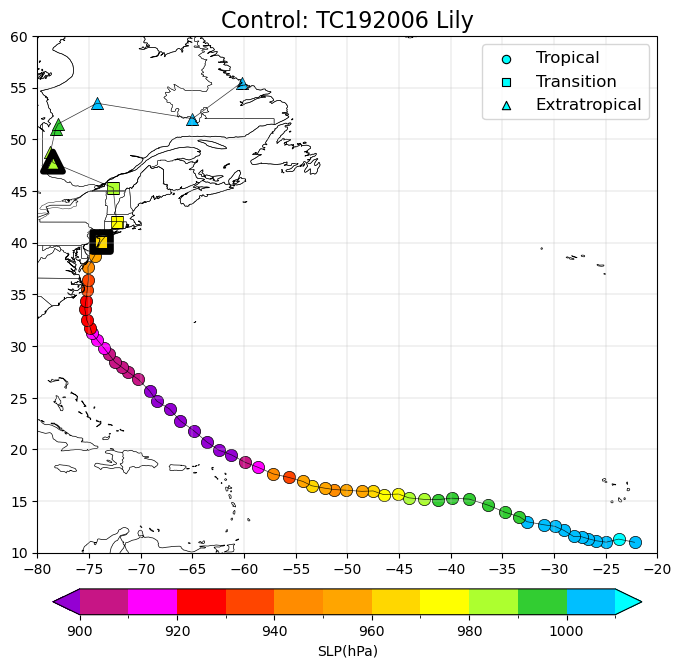

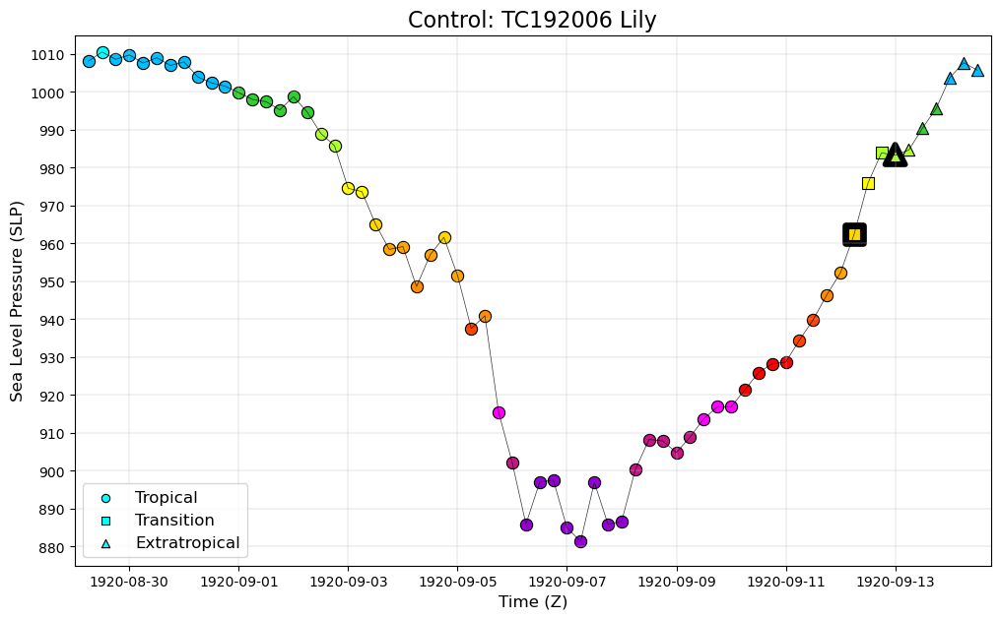

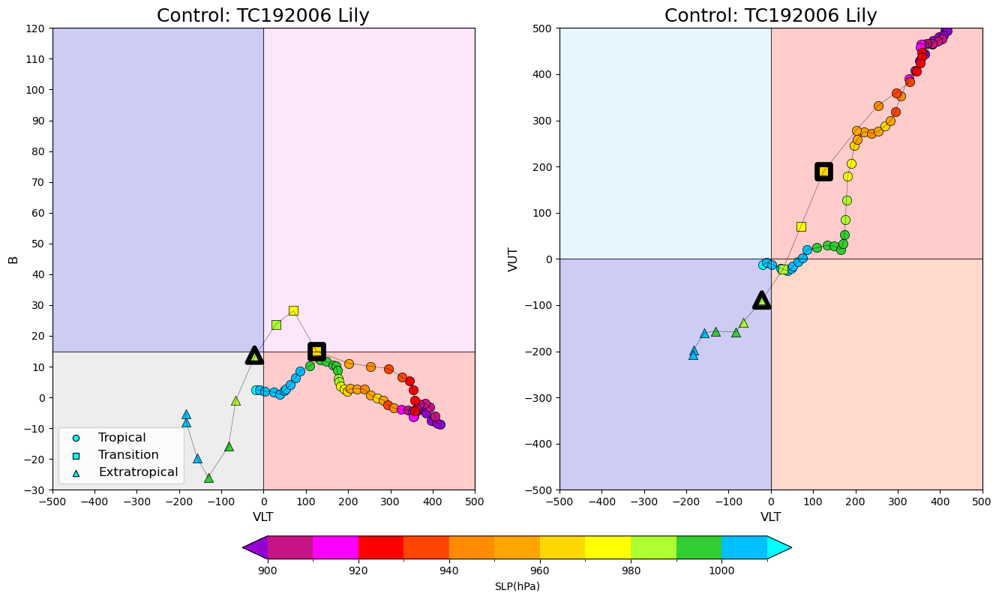

In [22]:
# Input Code
Code = 'TC192006'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (8,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

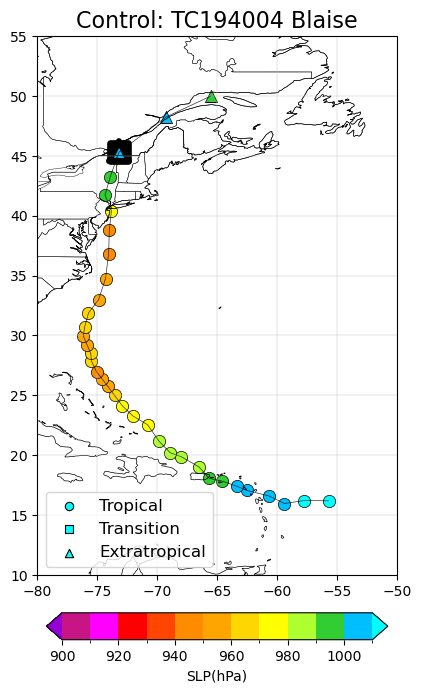

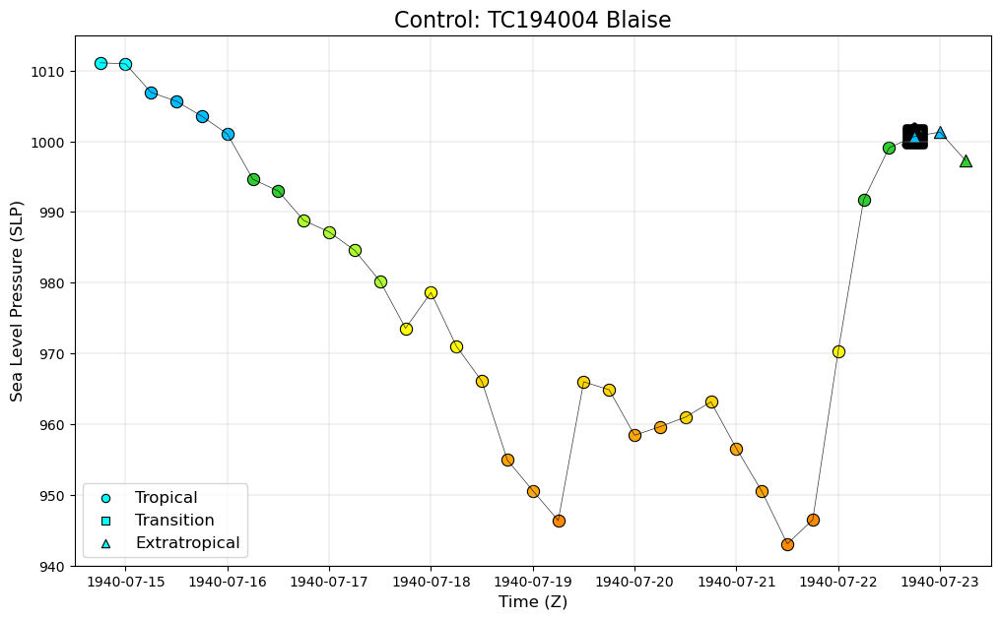

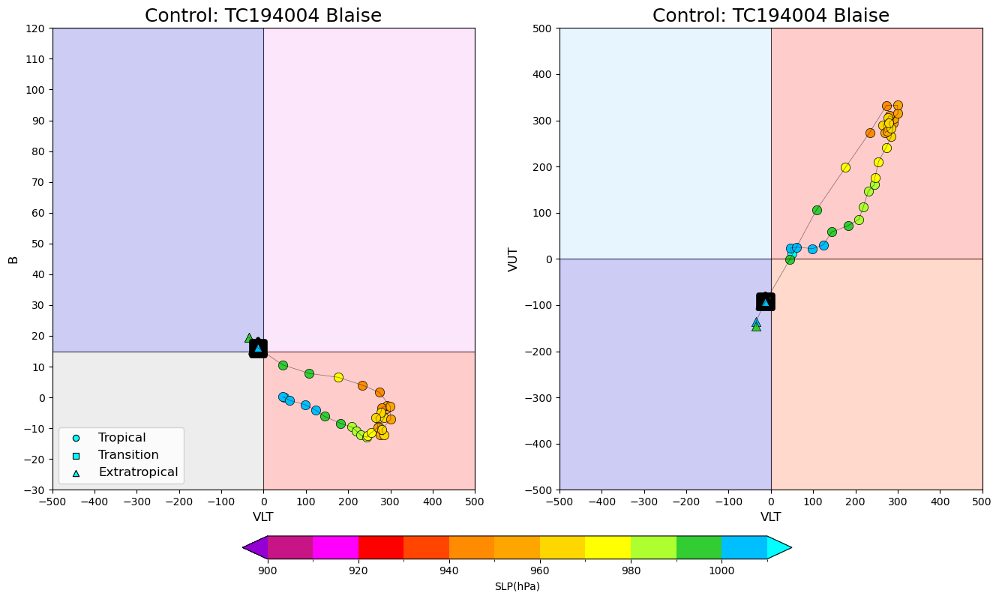

In [23]:
# Input Code
Code = 'TC194004'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True, (5,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

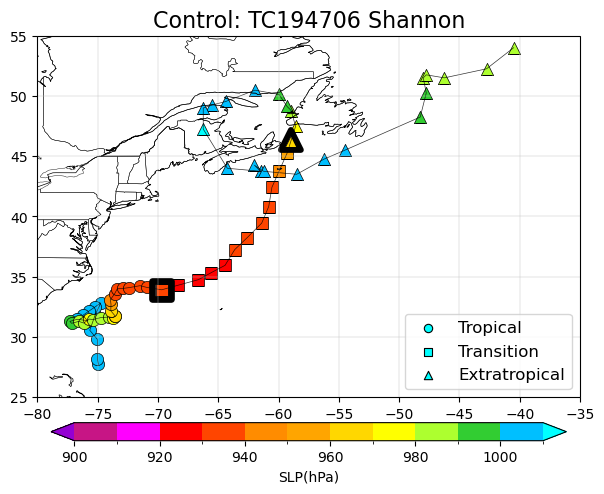

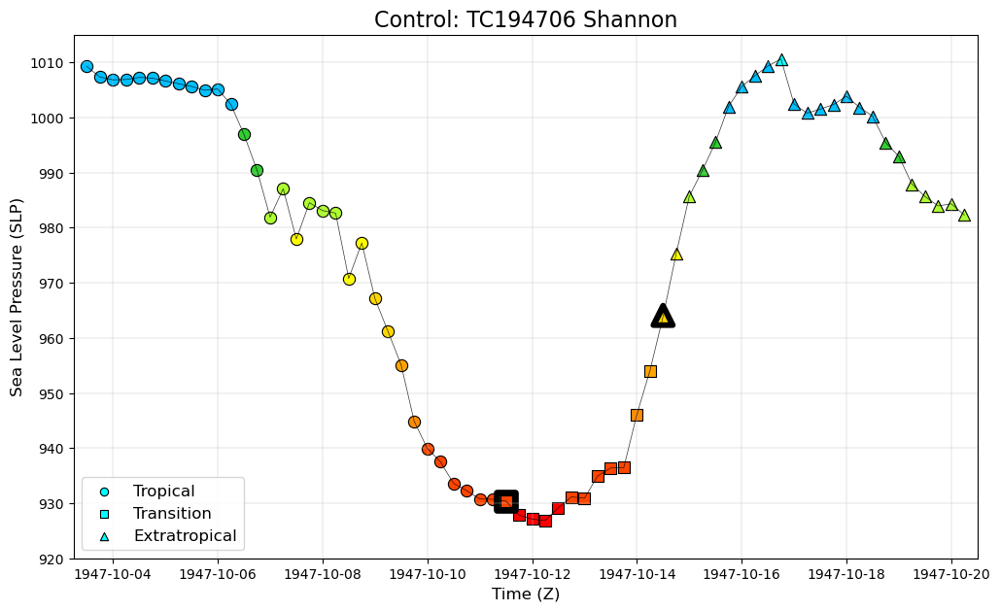

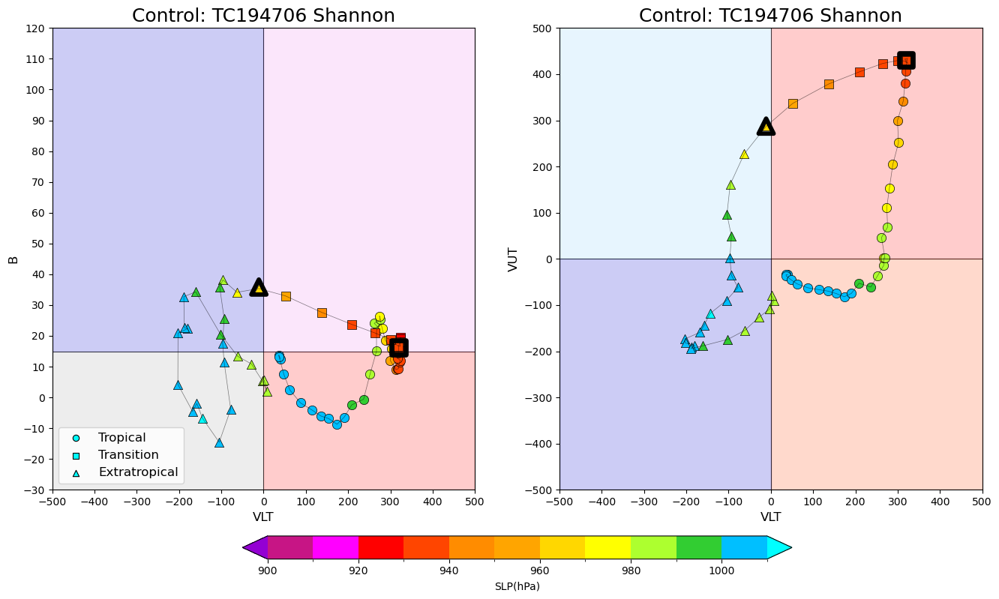

In [24]:
# Input Code
Code = 'TC194706'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", True, (7,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

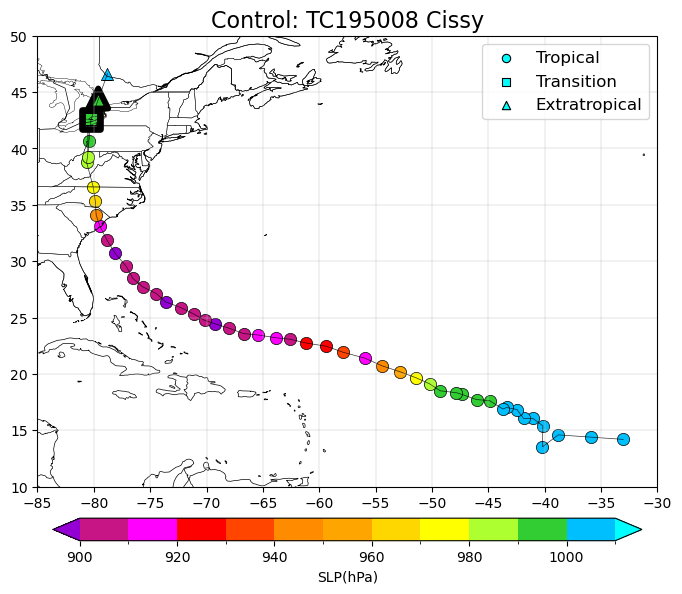

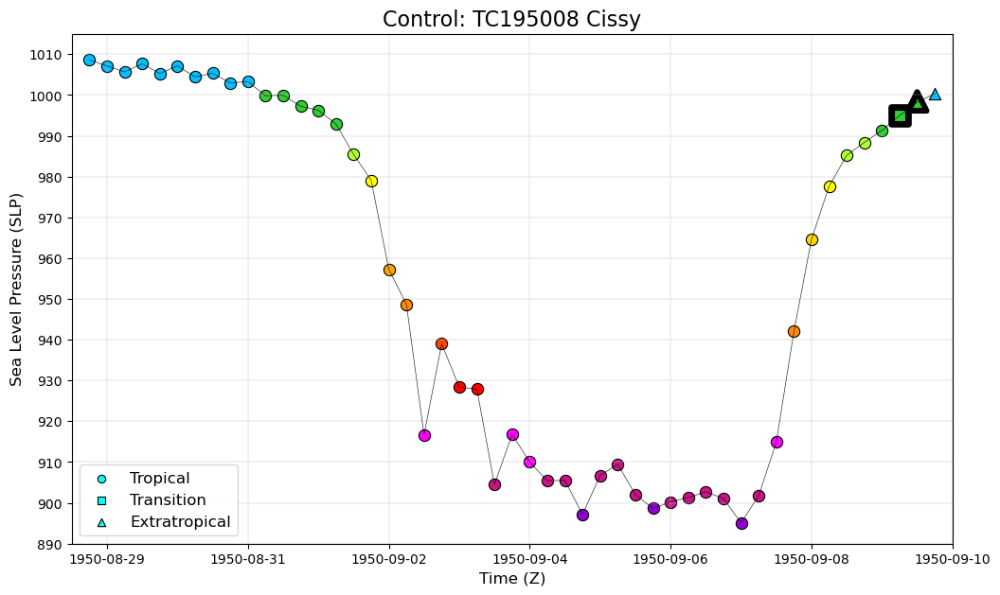

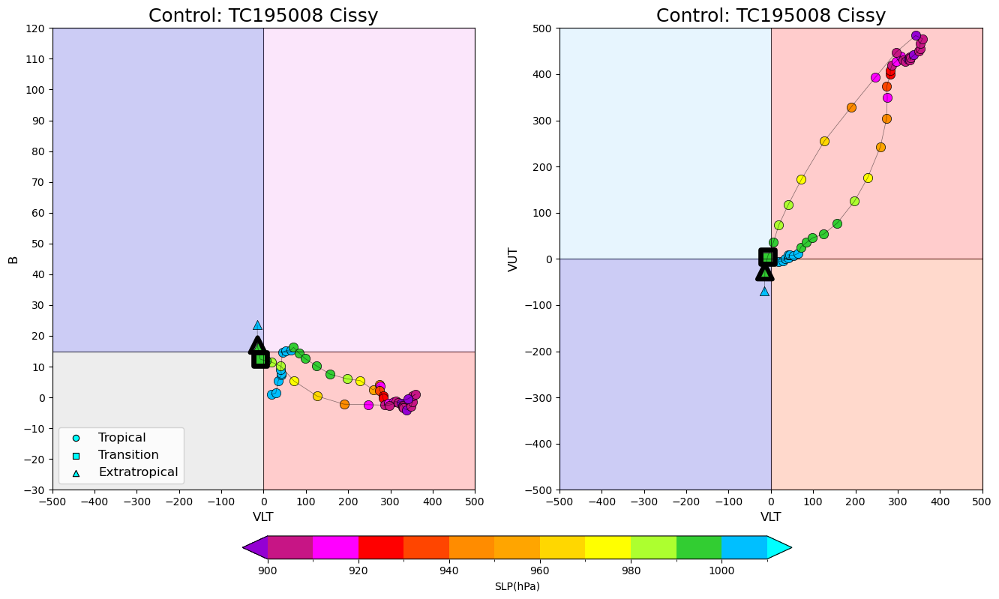

In [25]:
# Input Code
Code = 'TC195008'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (8,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

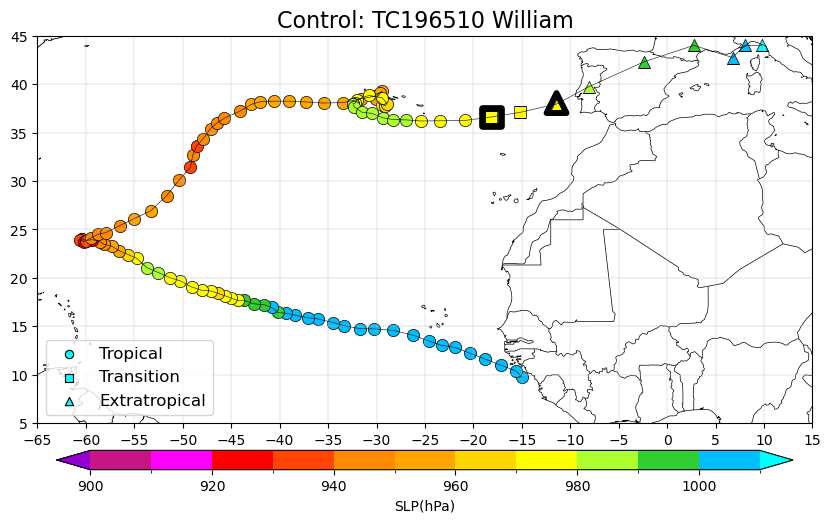

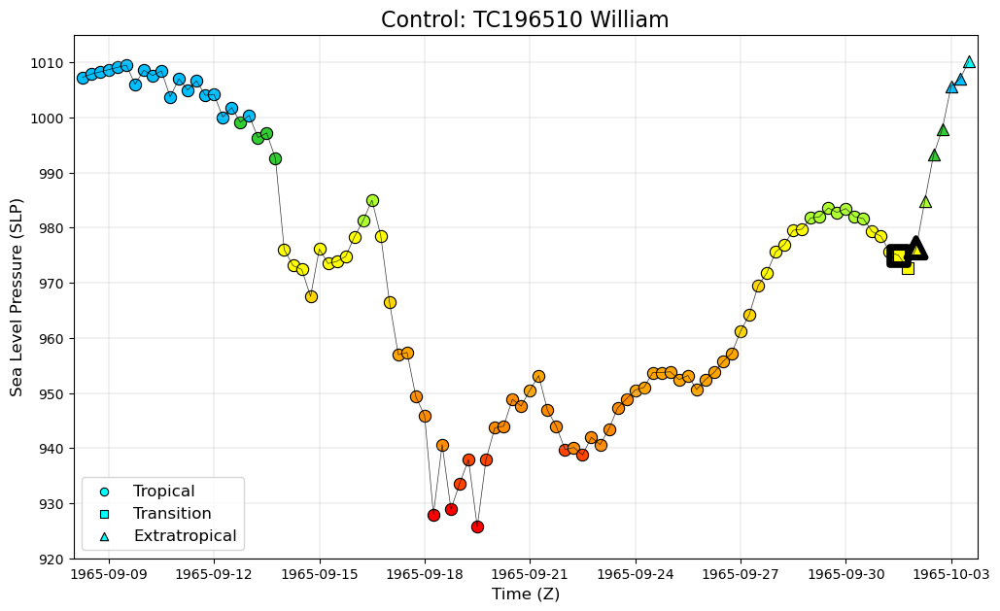

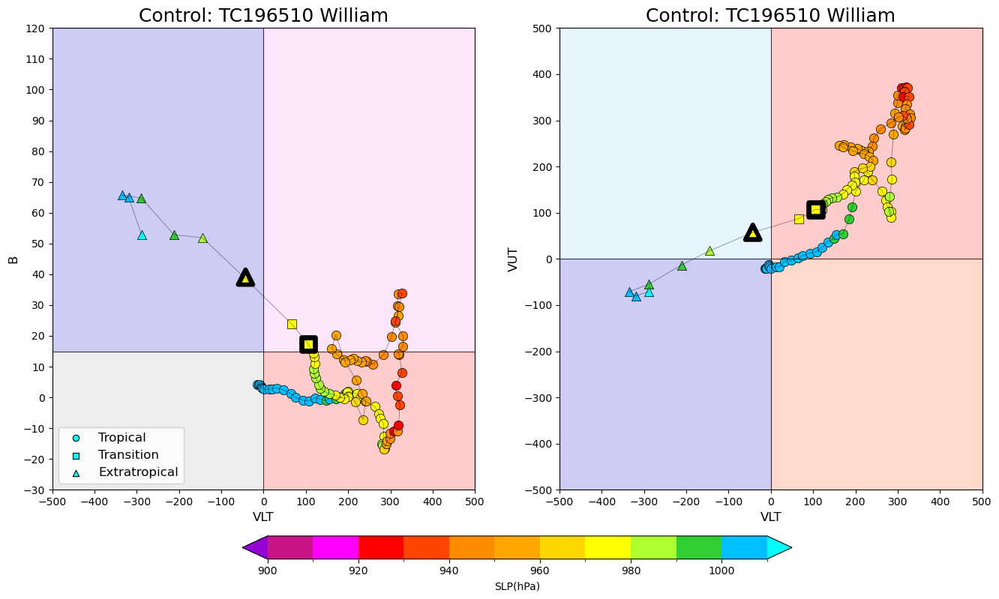

In [26]:
# Input Code
Code = 'TC196510'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True, (10,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

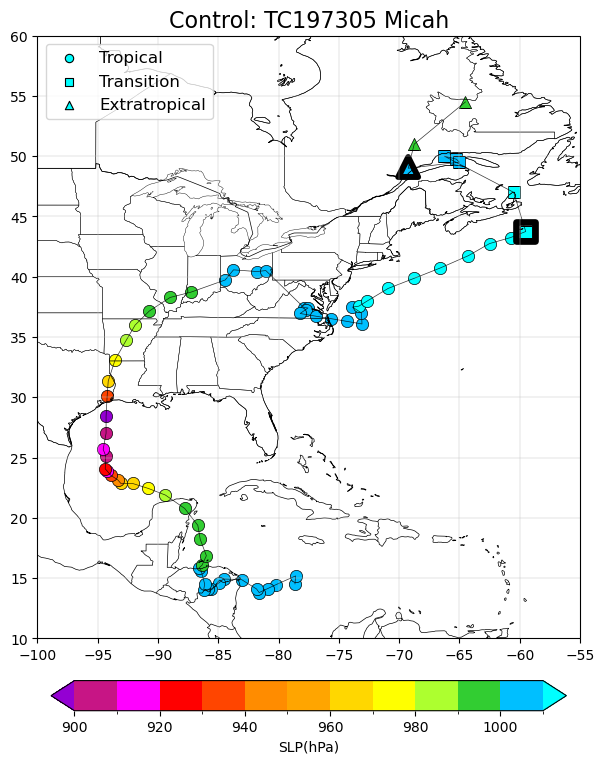

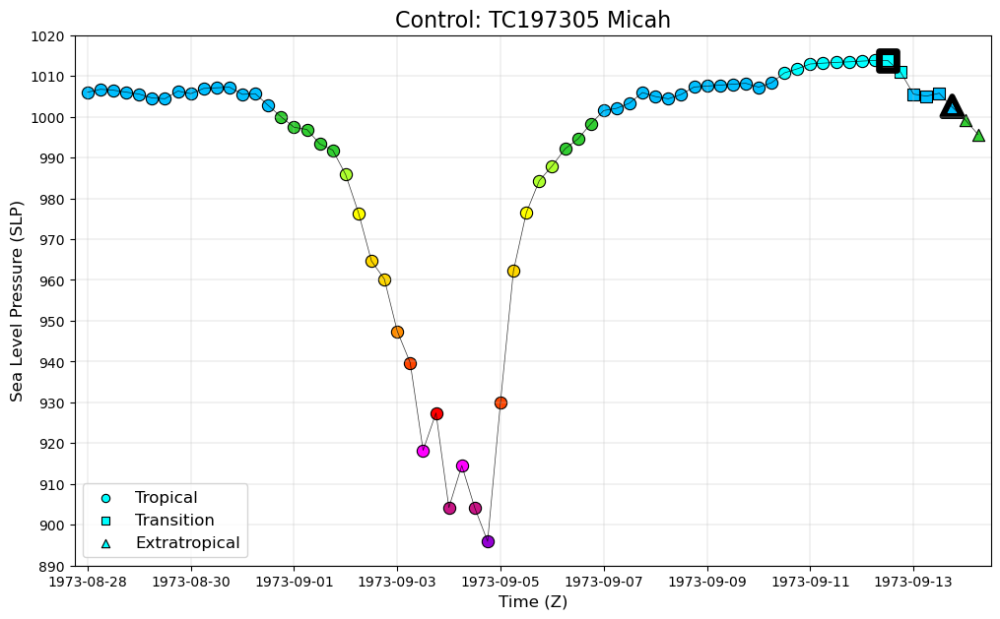

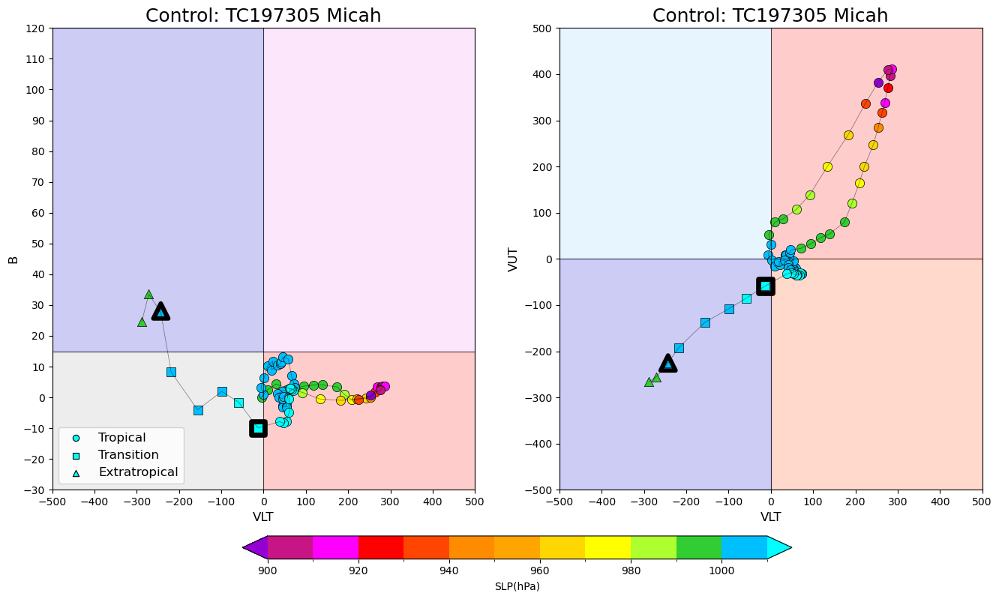

In [27]:
# Input Code
Code = 'TC197305'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", True, (7,8))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

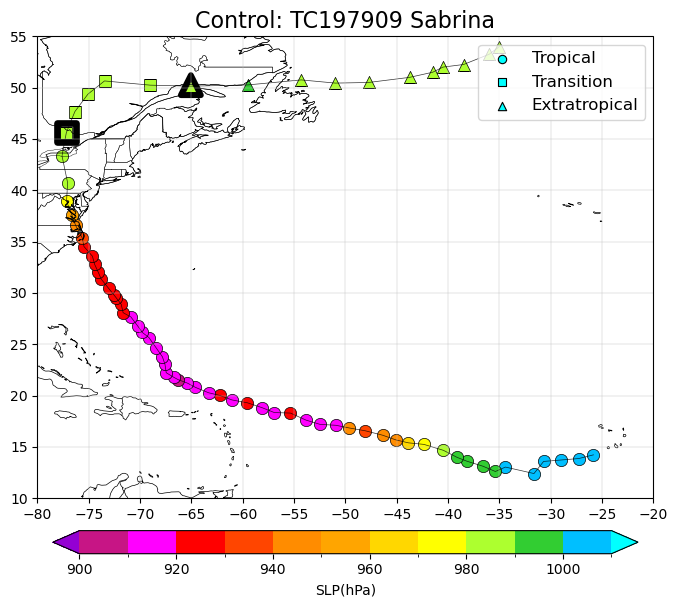

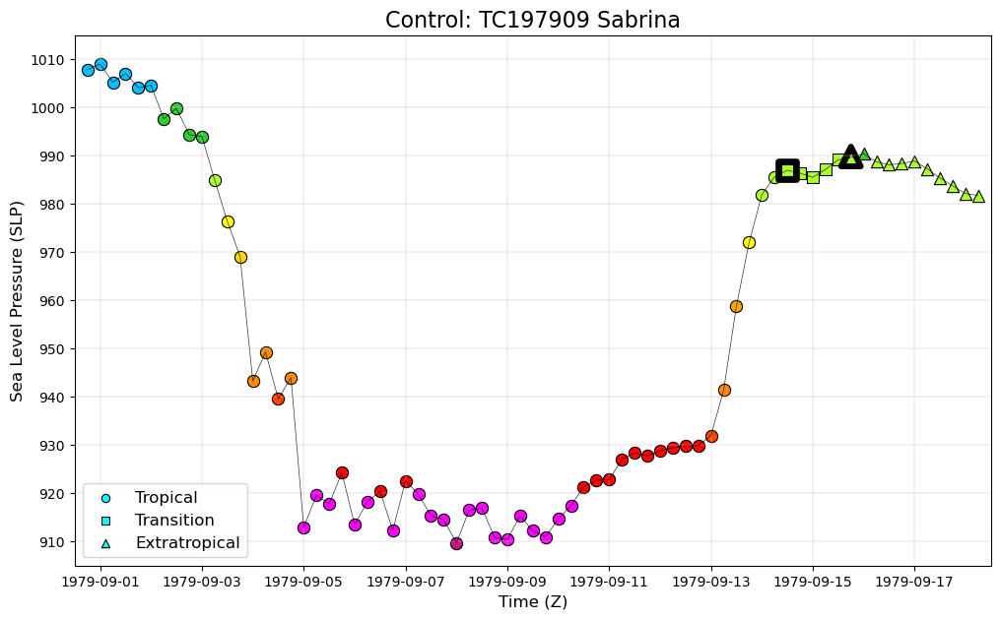

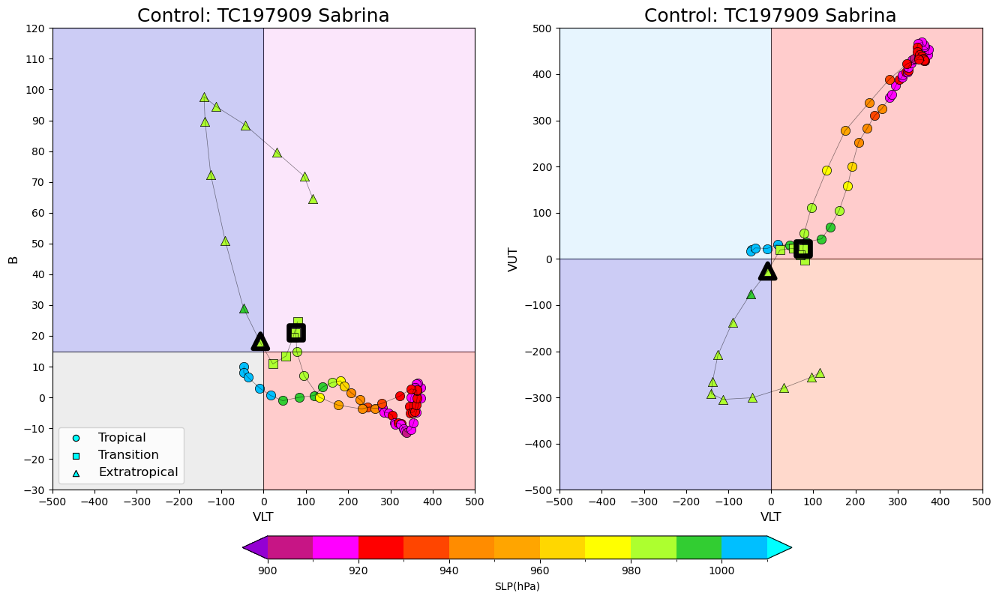

In [28]:
# Input Code
Code = 'TC197909'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 1, True, "Control", True, (8,6))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

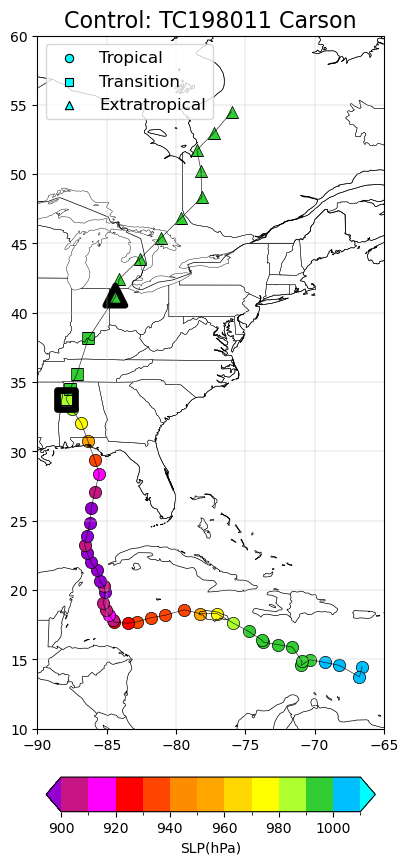

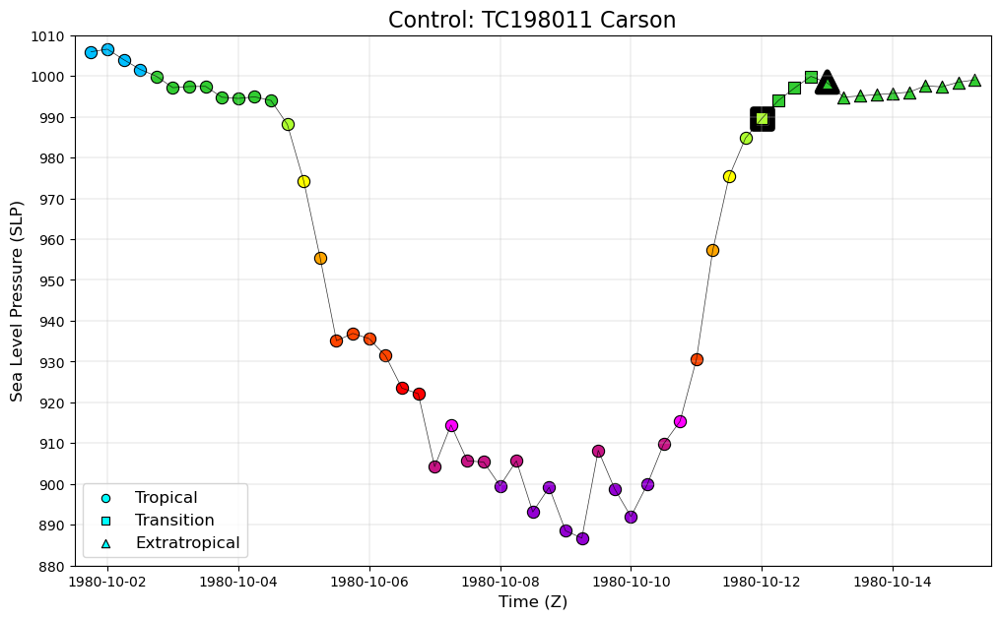

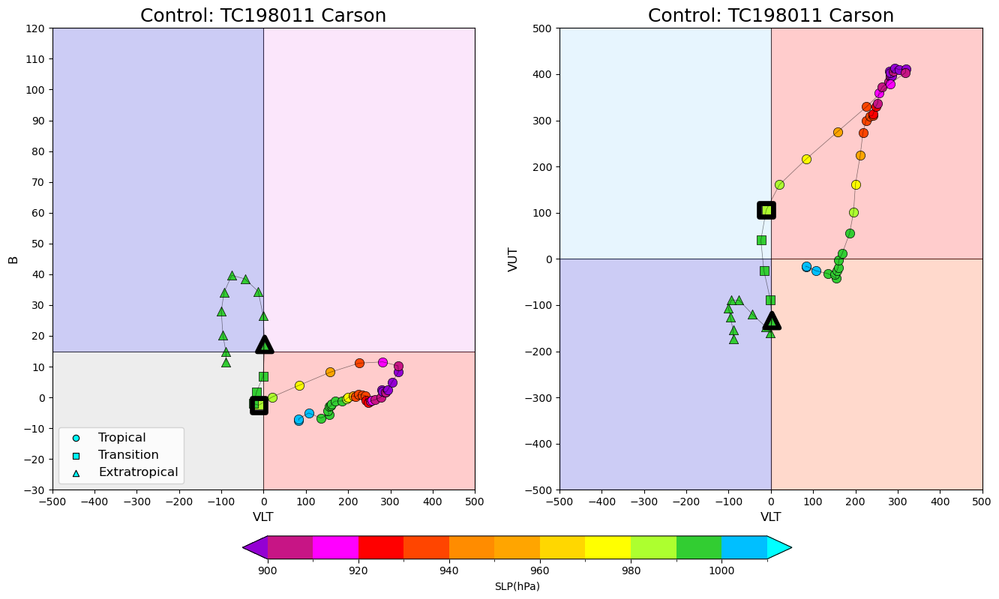

In [29]:
# Input Code
Code = 'TC198011'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", True, (5,9))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

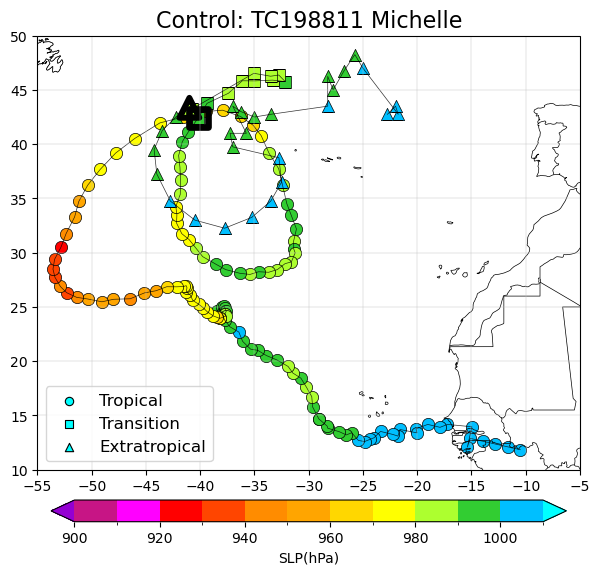

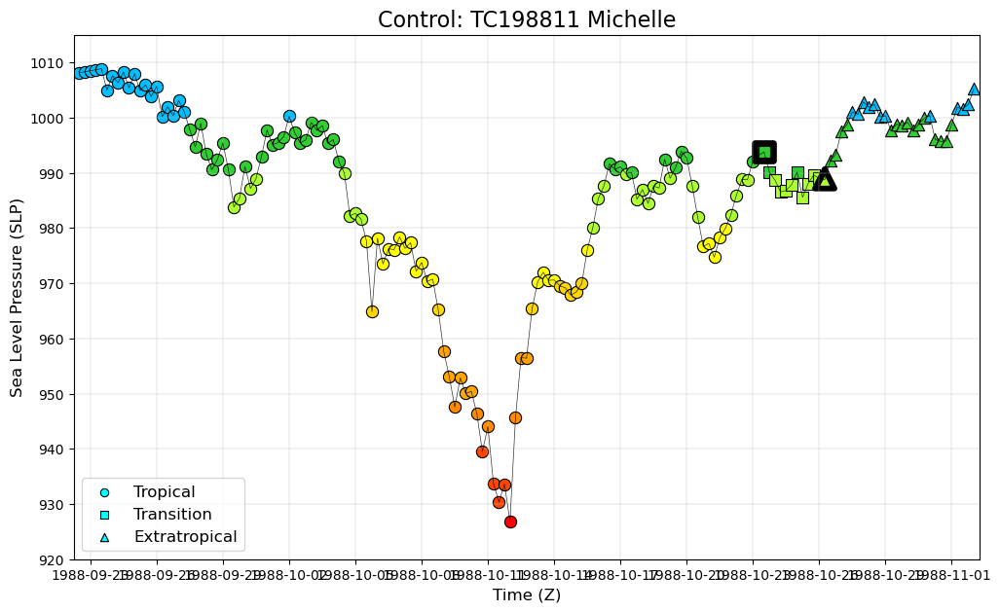

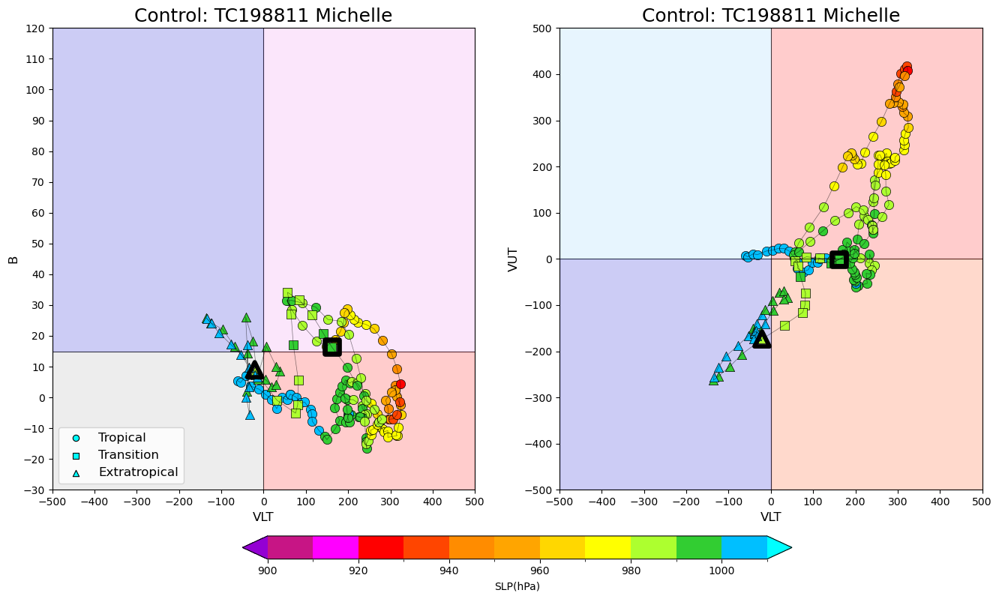

In [30]:
# Input Code
Code = 'TC198811'
Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True, (7,7))
Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)
Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", True)

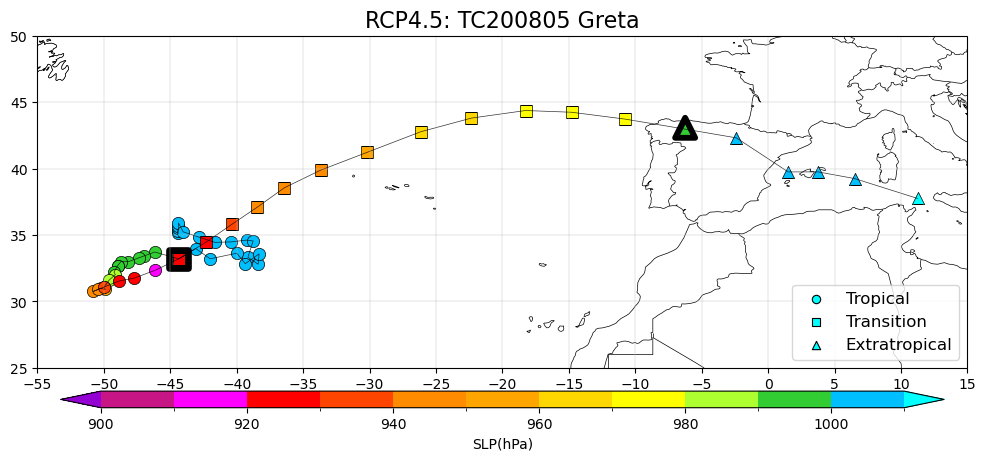

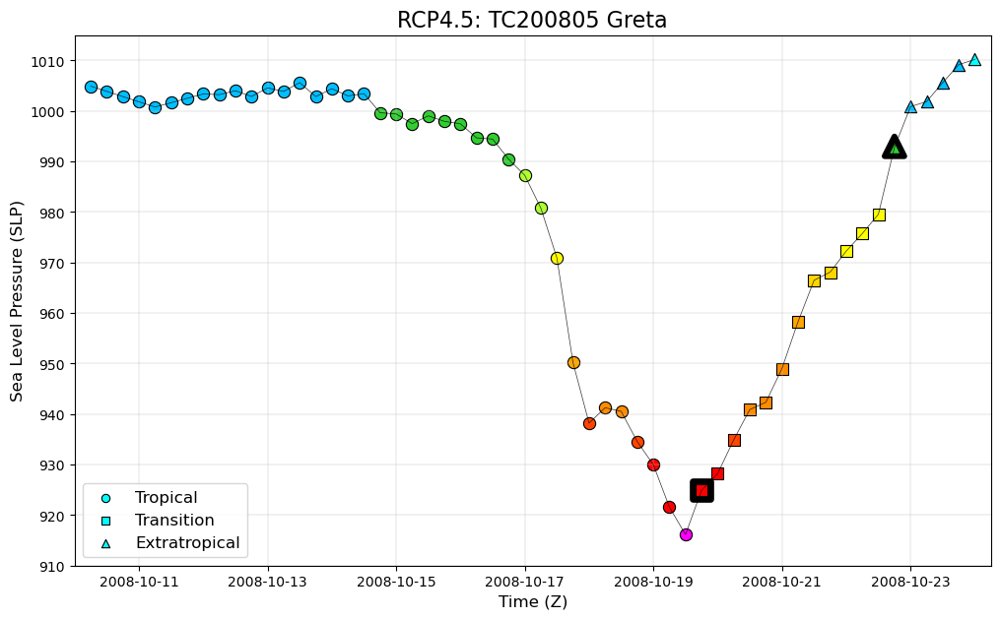

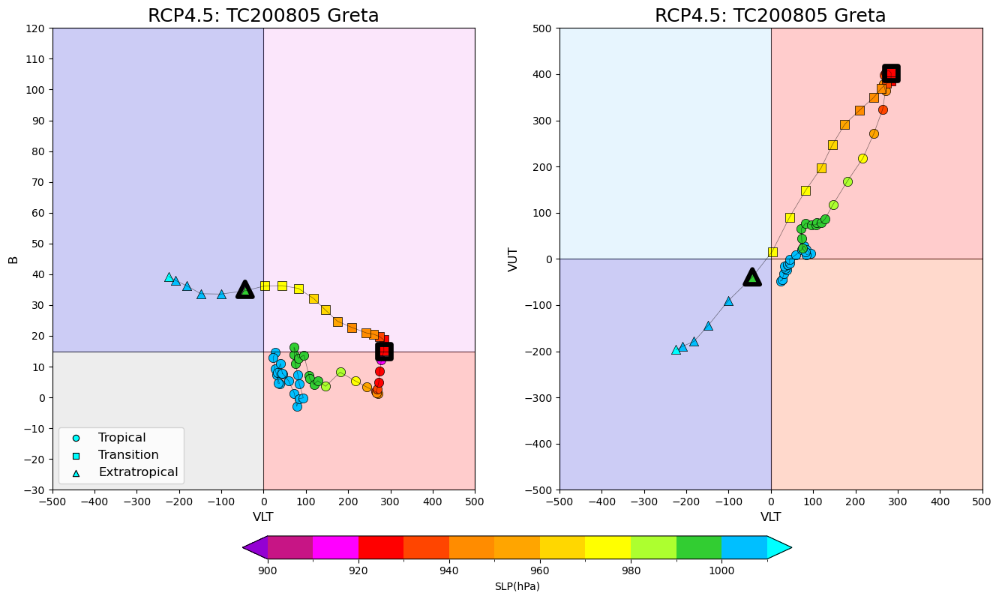

In [31]:
# Input Code
Code = 'TC200805'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP4.5", True, (12,5))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

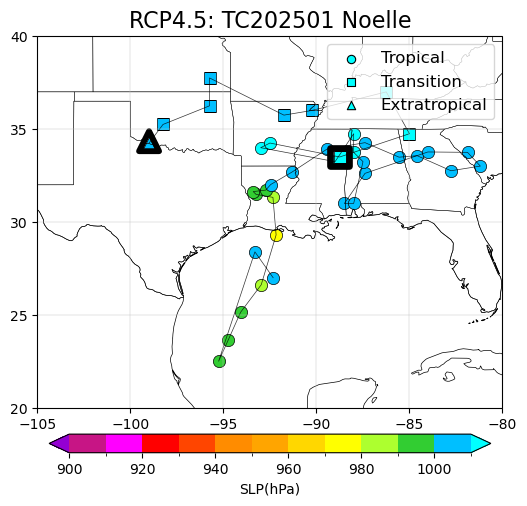

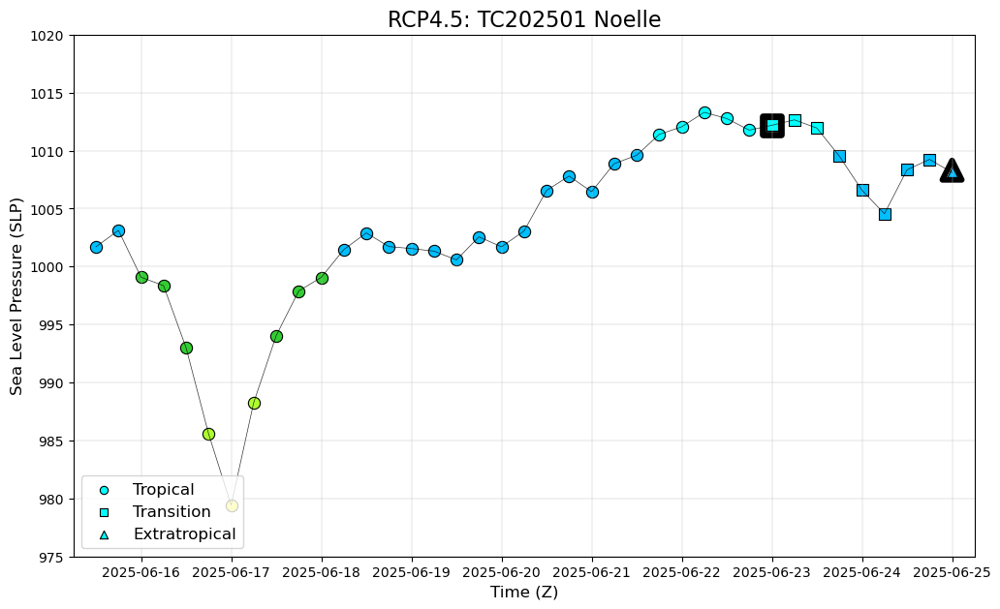

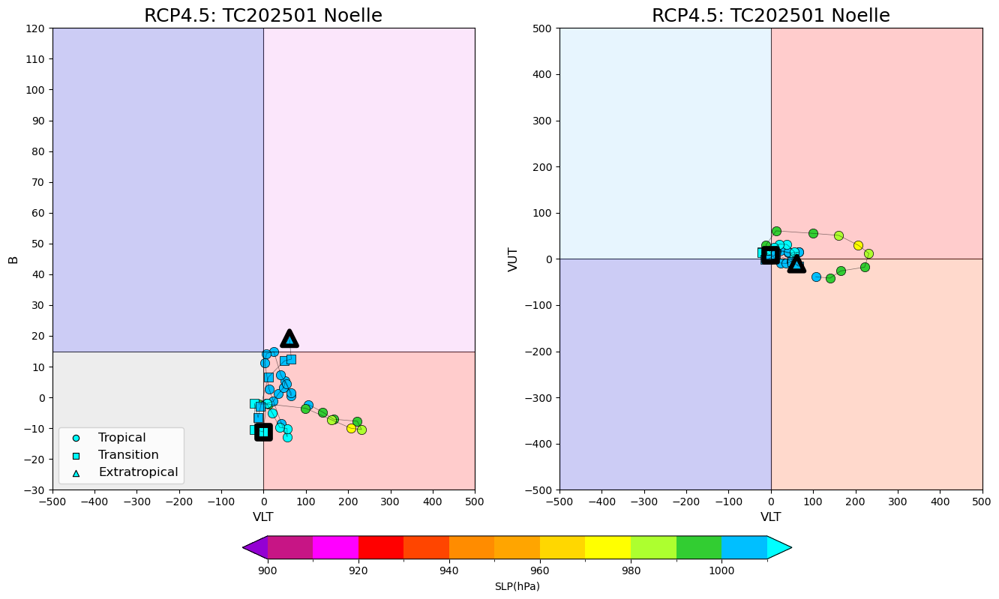

In [32]:
# Input Code
Code = 'TC202501'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP4.5", True, (6,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

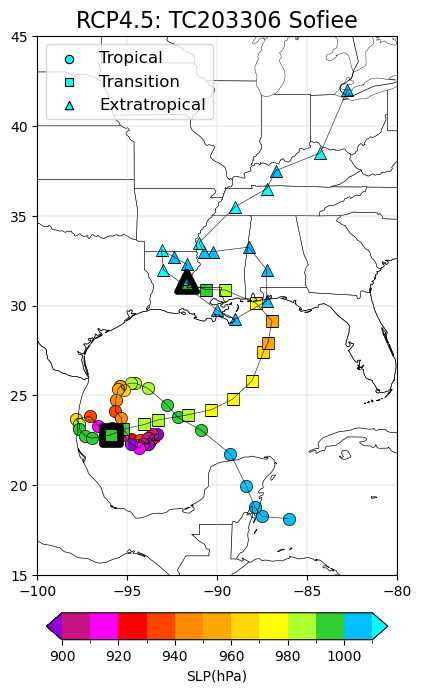

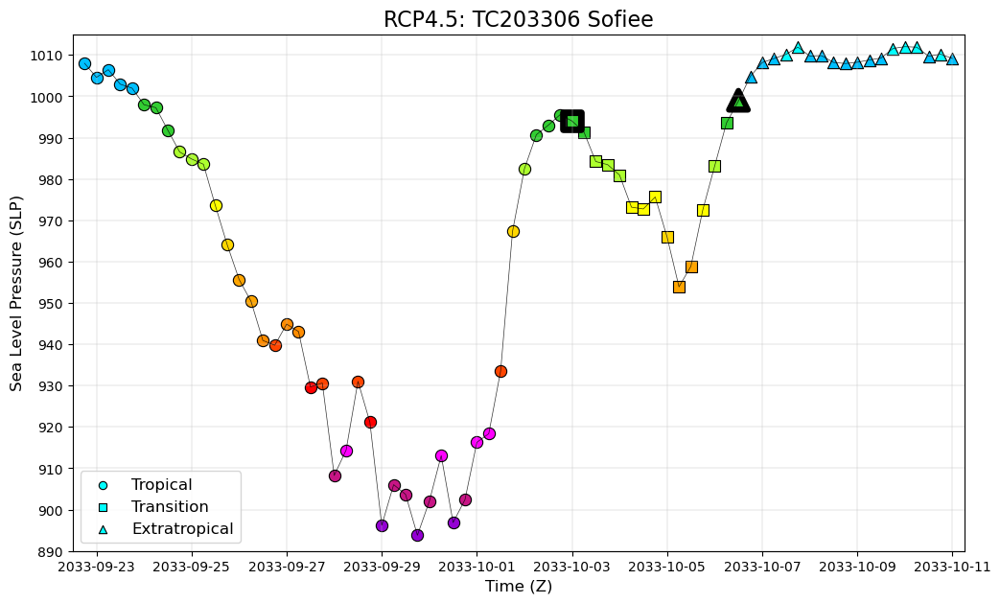

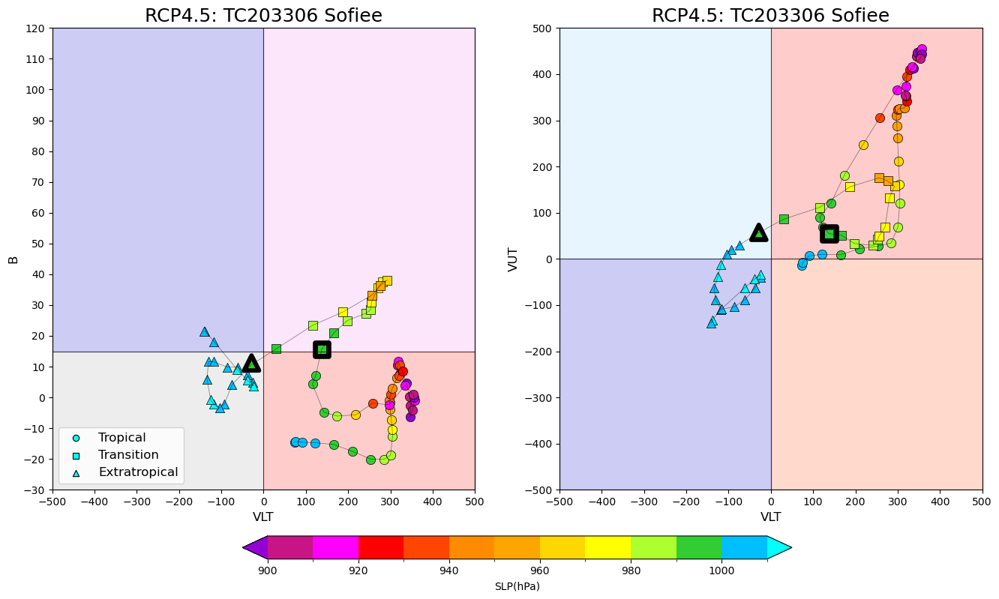

In [33]:
# Input Code
Code = 'TC203306'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", True, (5,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

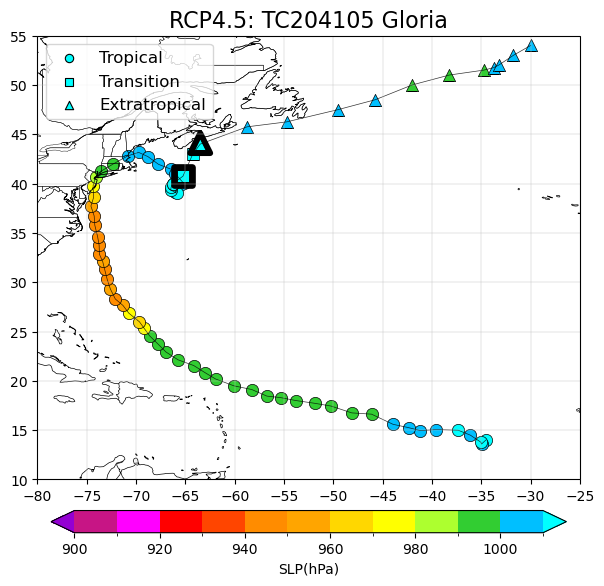

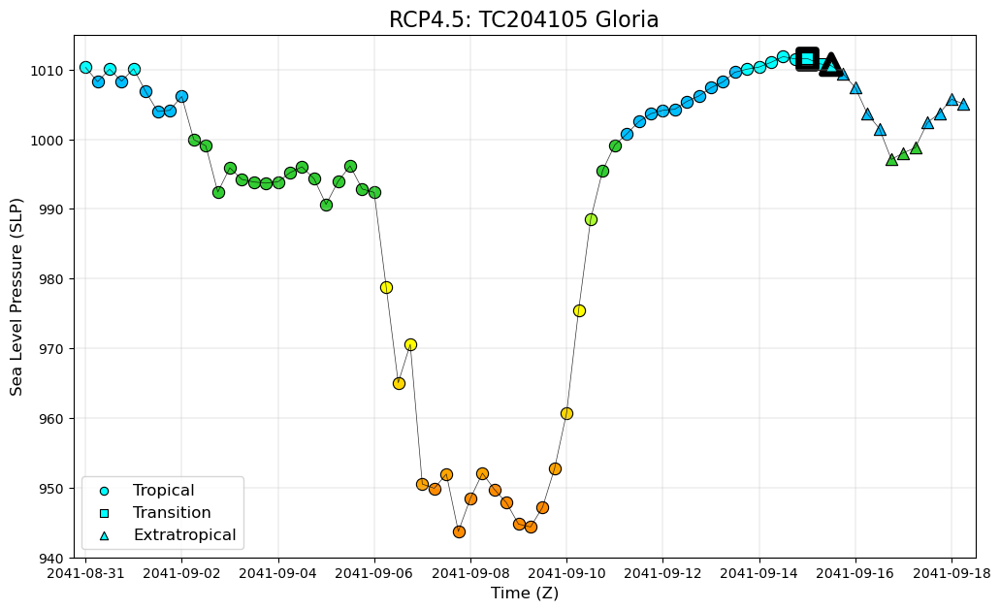

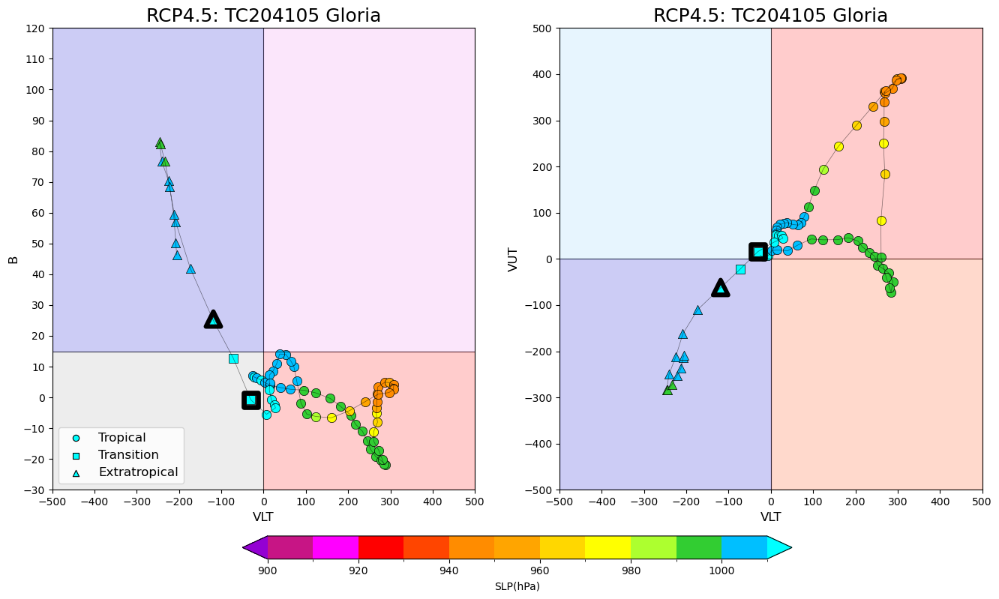

In [34]:
# Input Code
Code = 'TC204105'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", True, (7,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

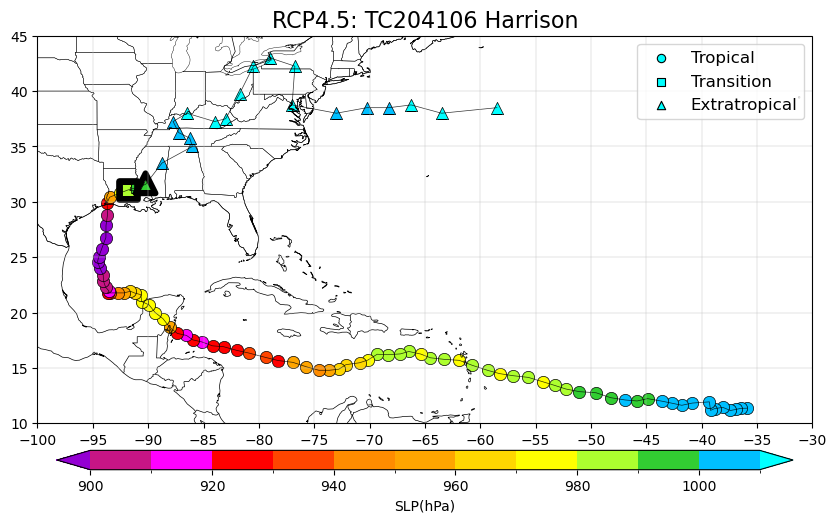

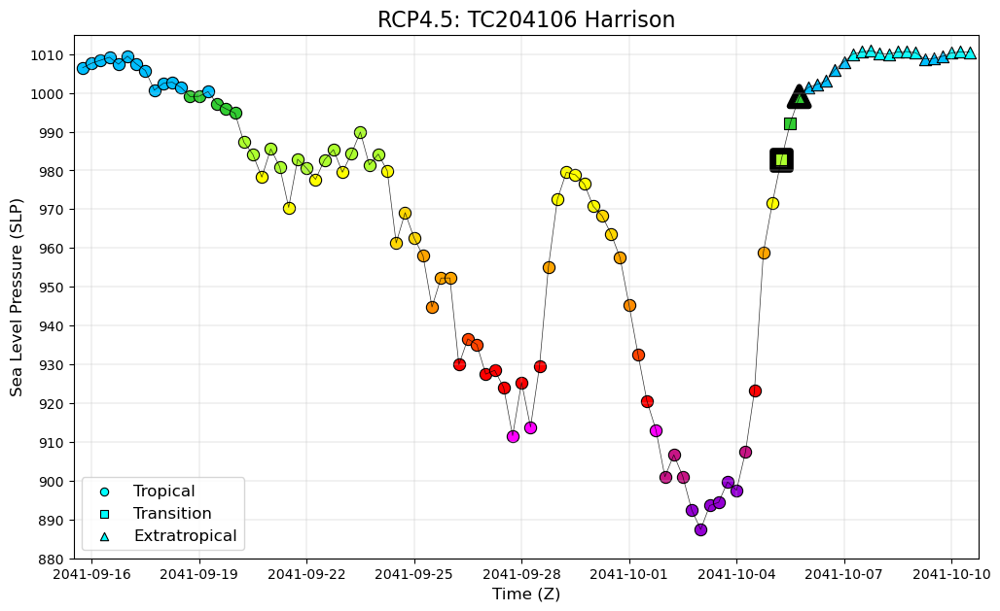

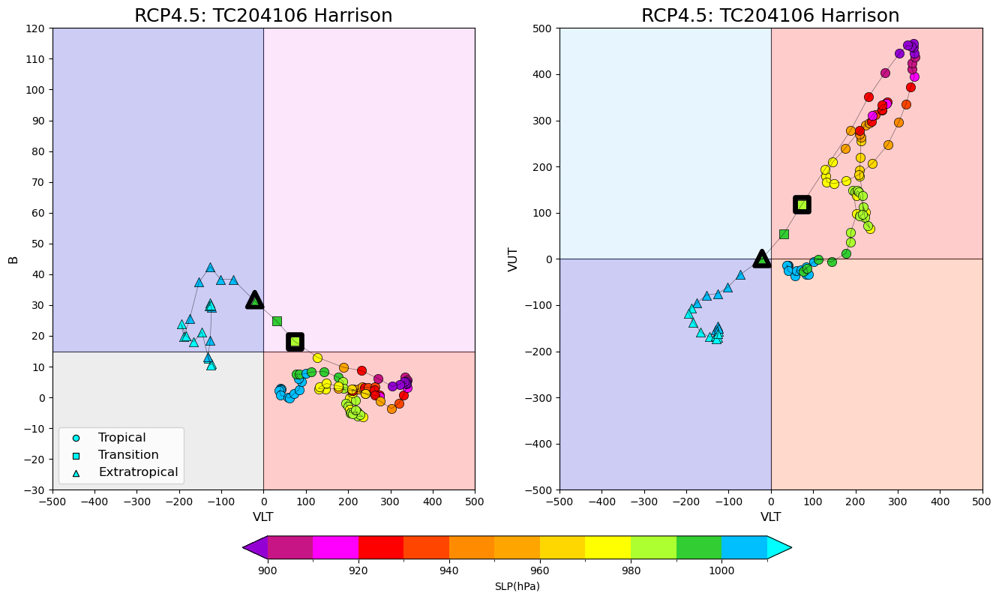

In [35]:
# Input Code
Code = 'TC204106'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP4.5", True, (10,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

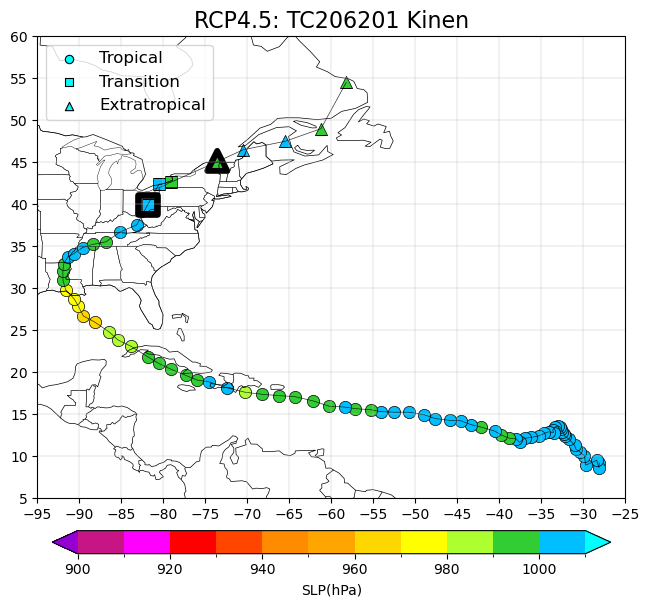

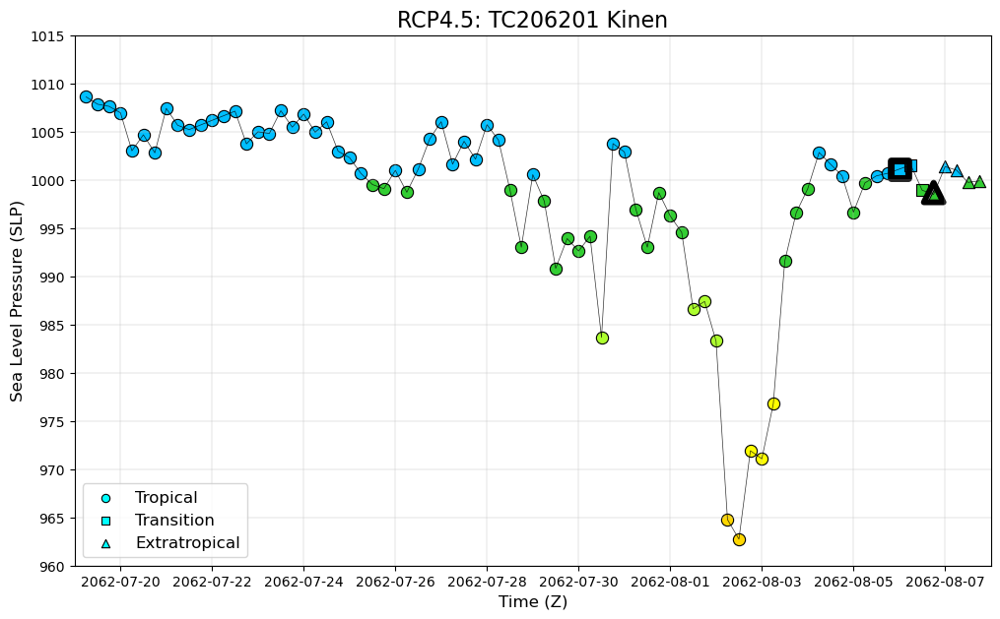

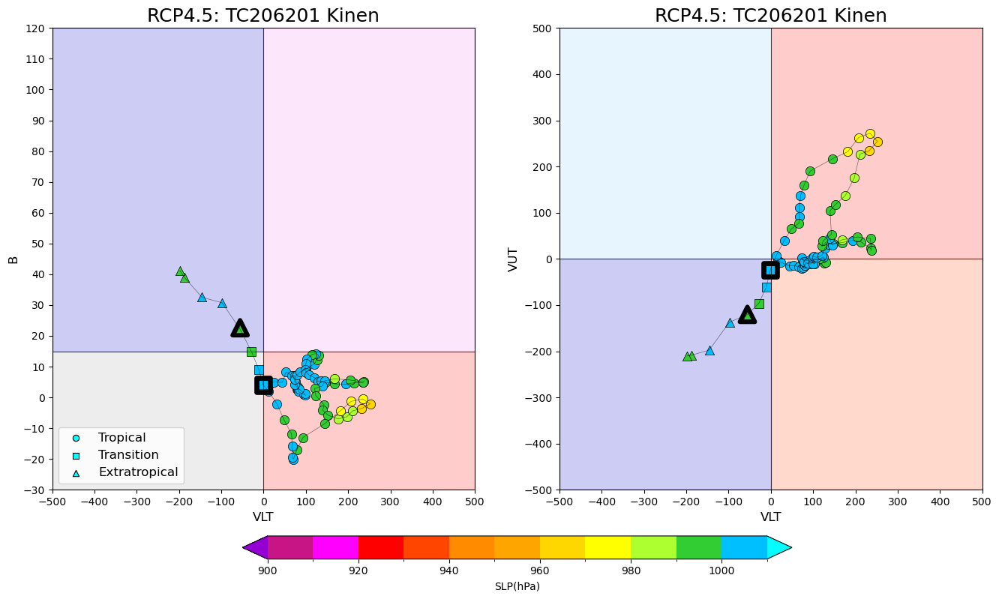

In [36]:
# Input Code
Code = 'TC206201'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", True, (8,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

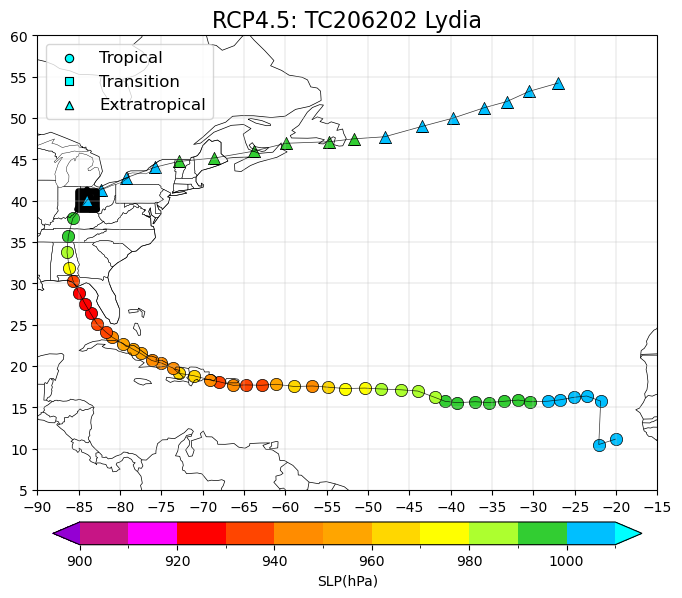

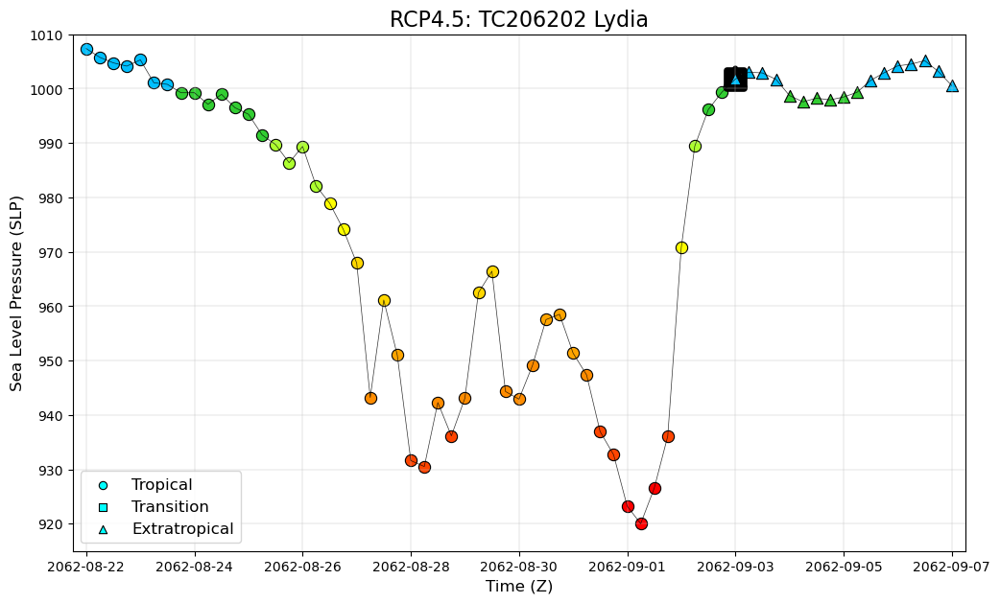

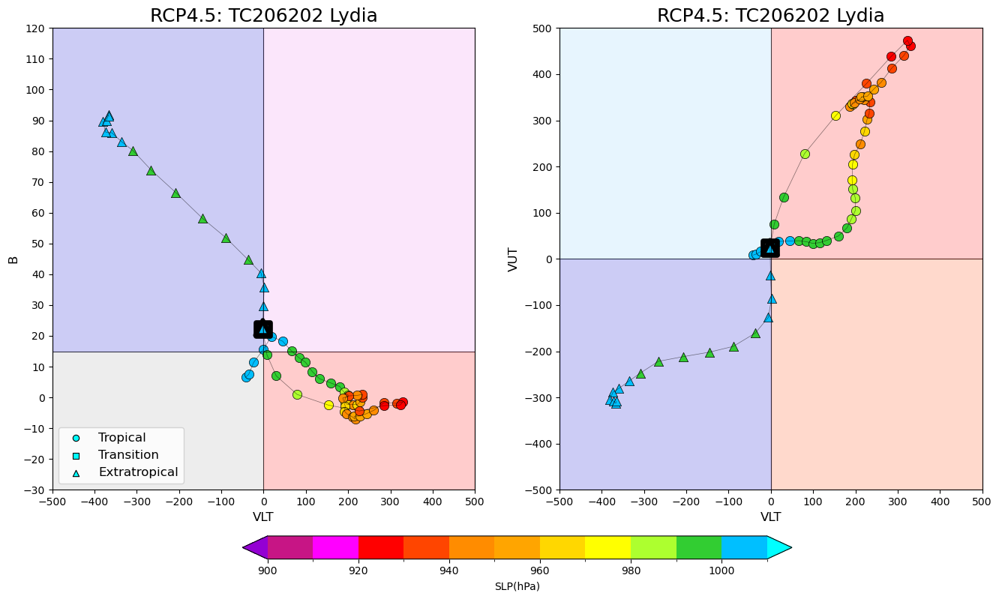

In [37]:
# Input Code
Code = 'TC206202'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", True, (8,6))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

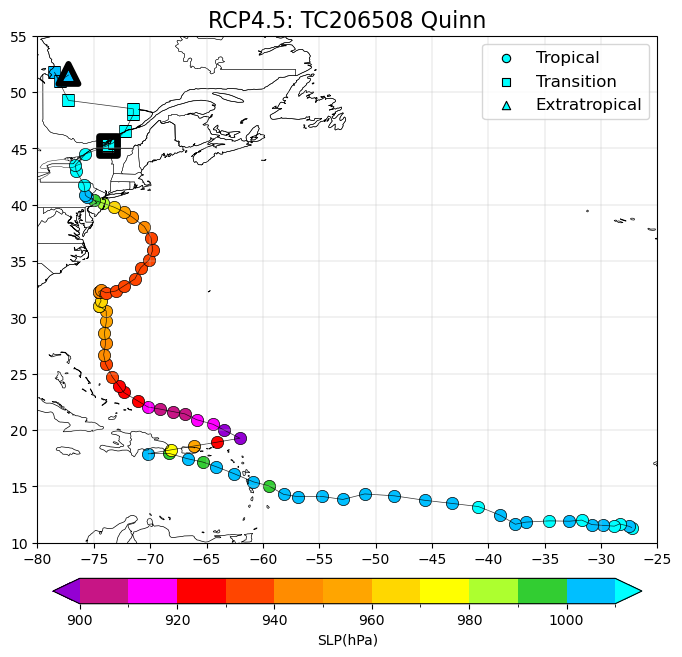

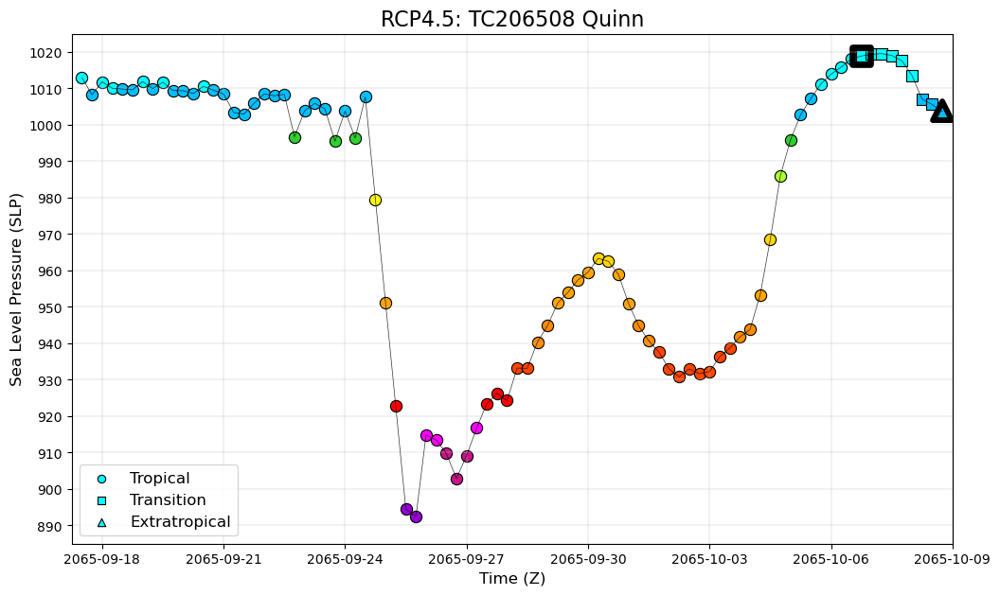

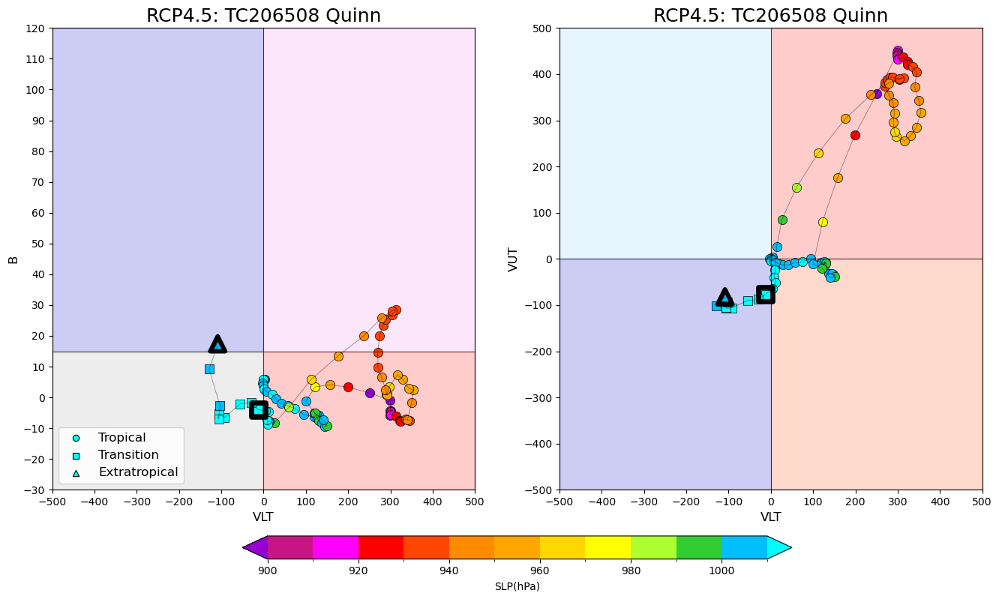

In [38]:
# Input Code
Code = 'TC206508'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP4.5", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

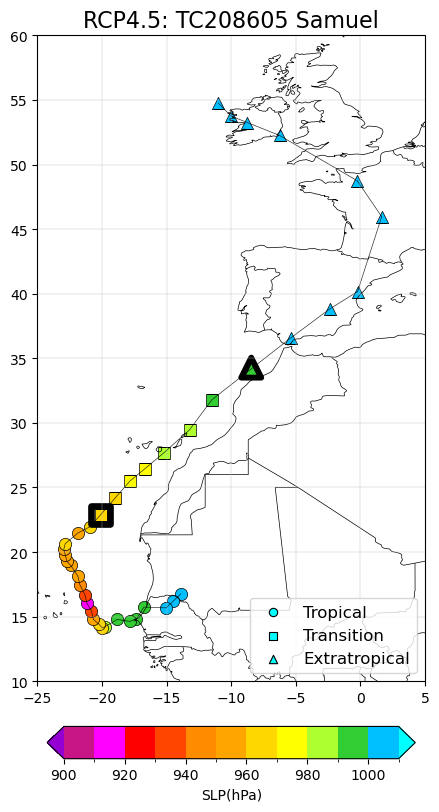

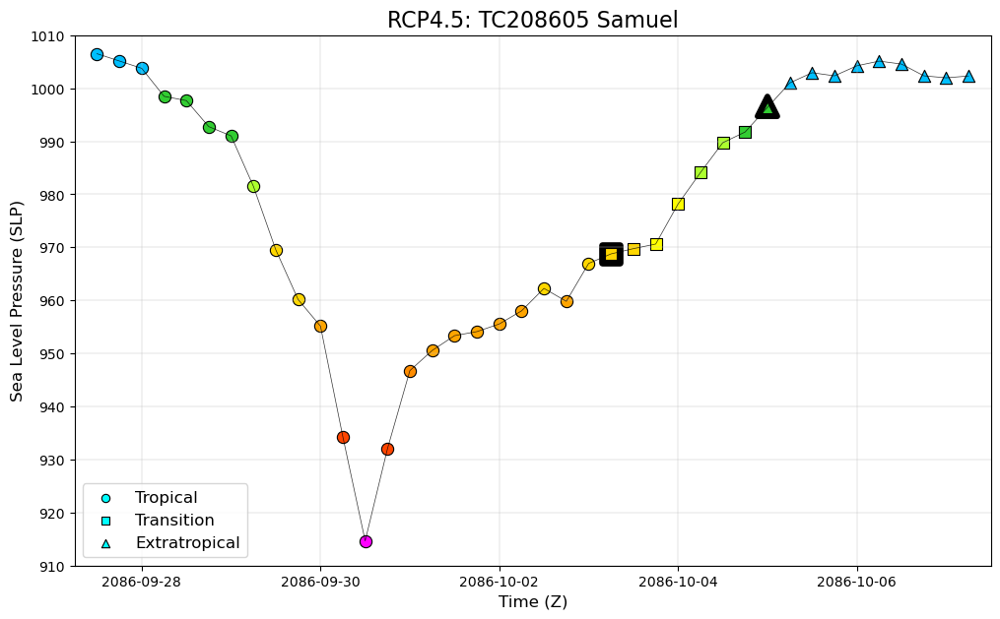

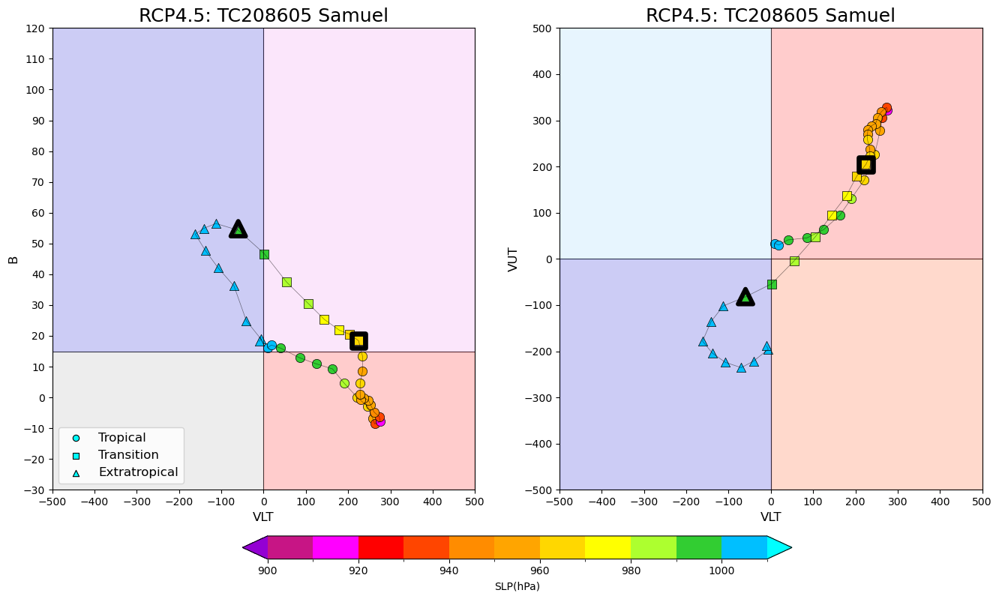

In [39]:
# Input Code
Code = 'TC208605'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP4.5", True, (5,9))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

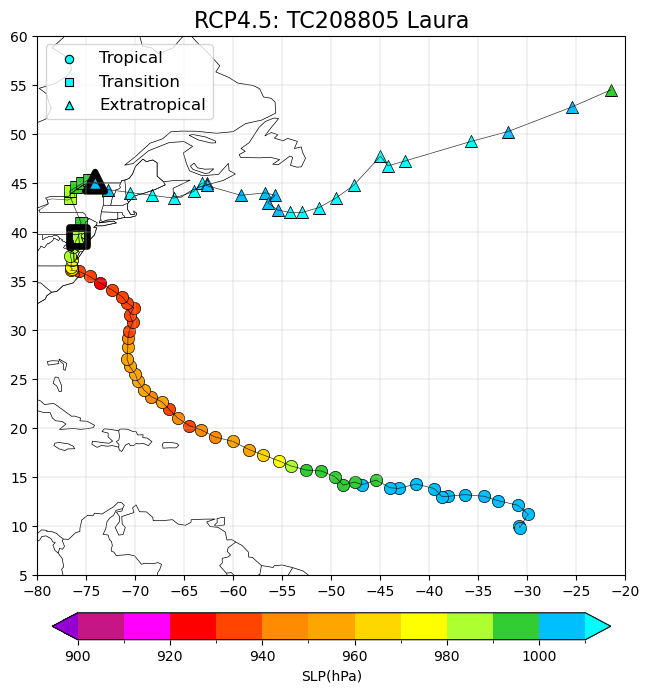

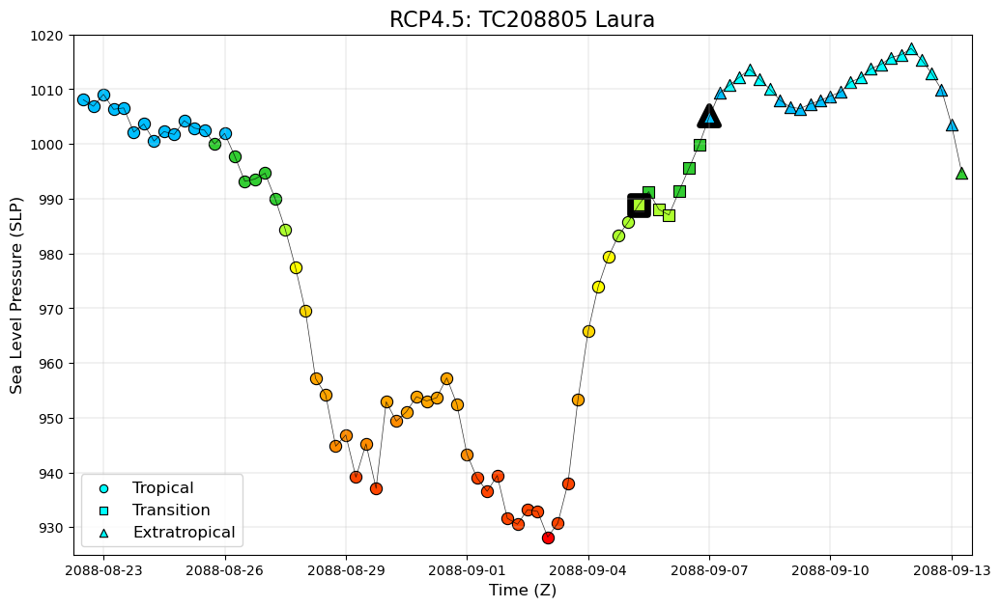

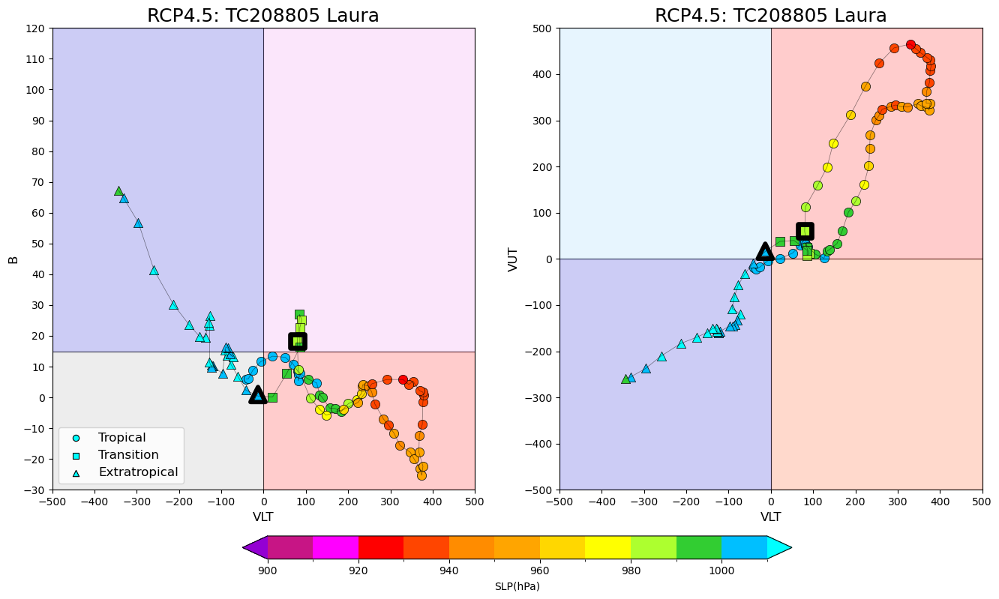

In [40]:
# Input Code
Code = 'TC208805'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", True, (8,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", True)

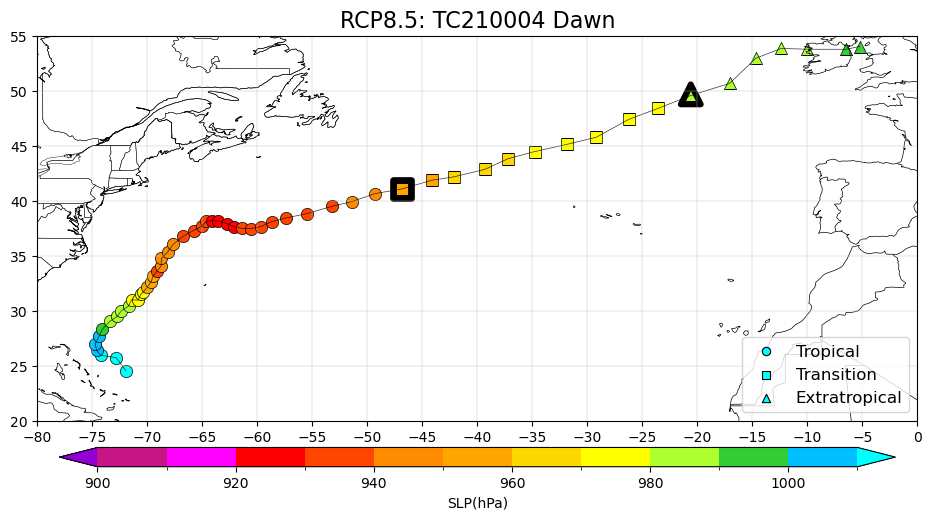

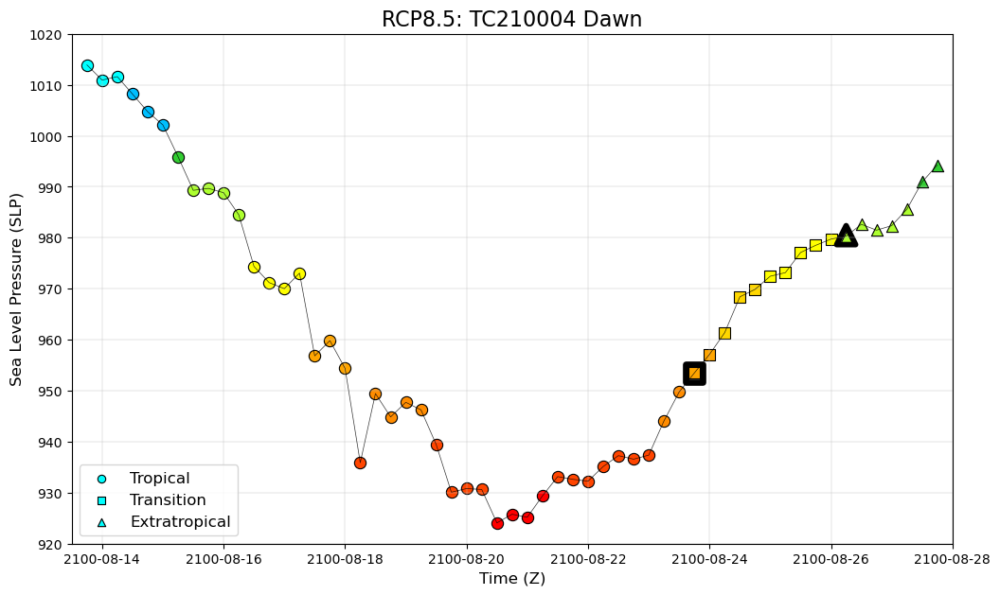

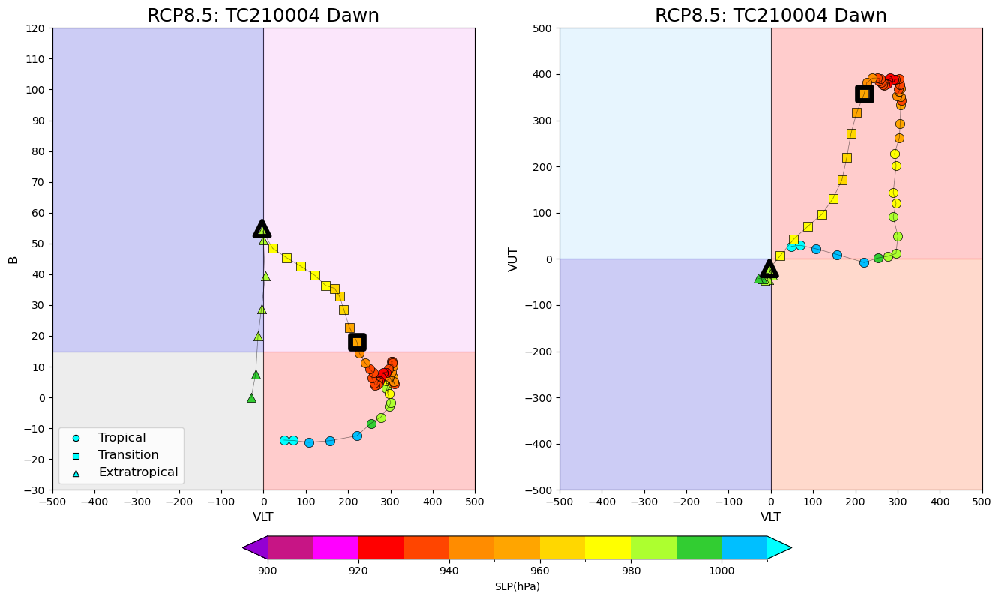

In [41]:
# Input Code
Code = 'TC210004'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP8.5", True, (12,5))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

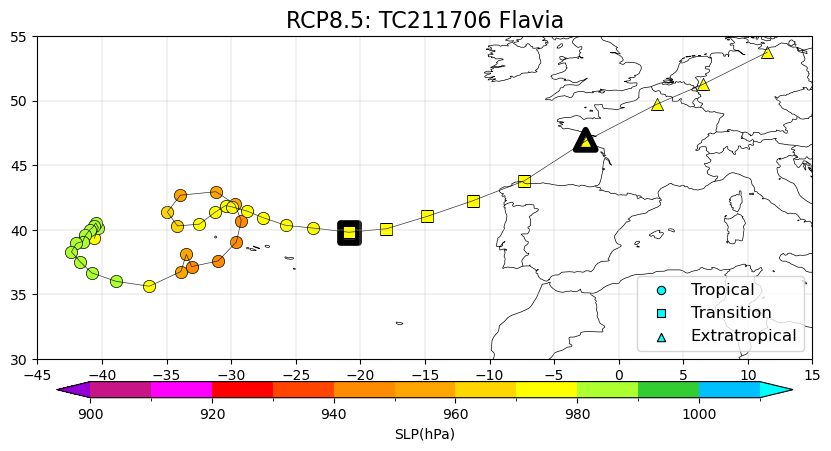

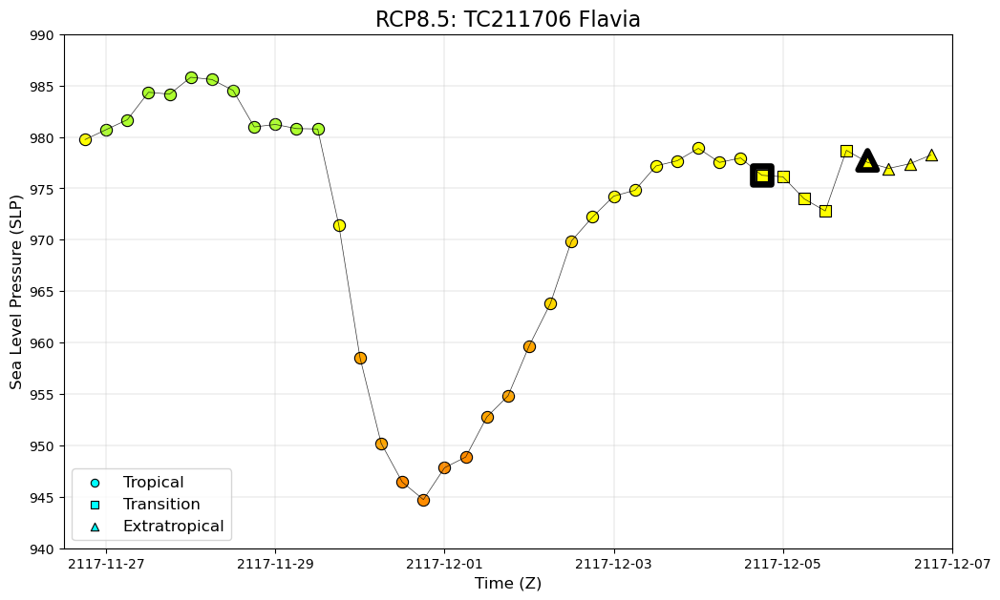

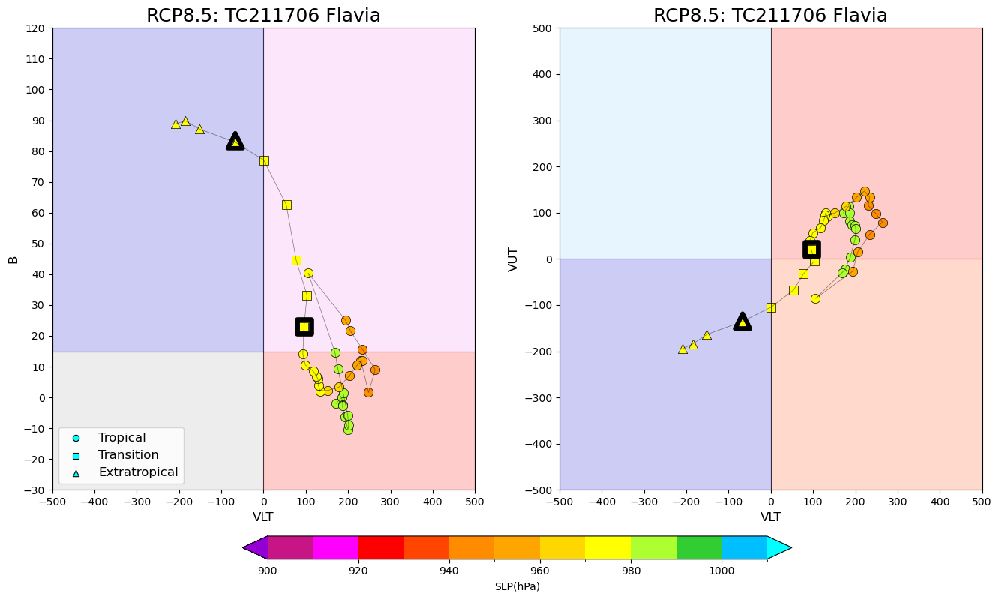

In [42]:
# Input Code
Code = 'TC211706'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP8.5", True, (10,5))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

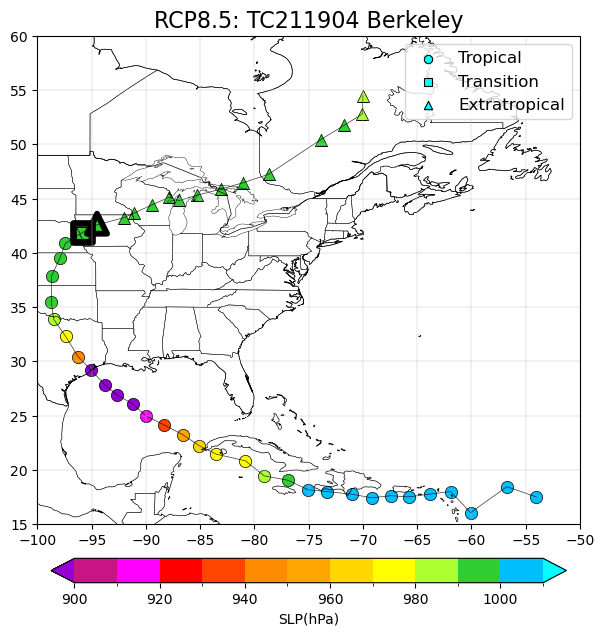

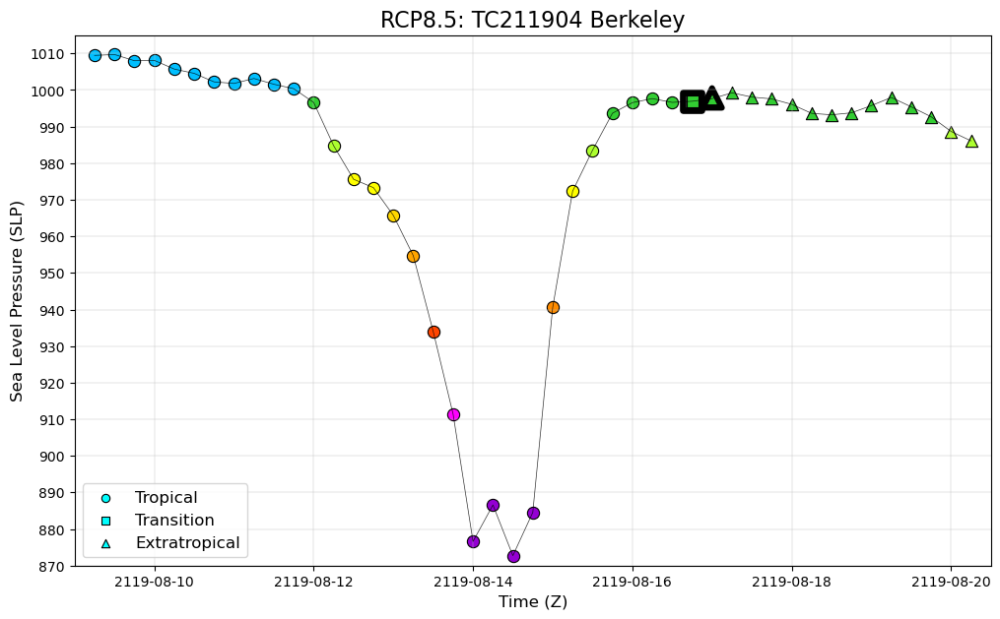

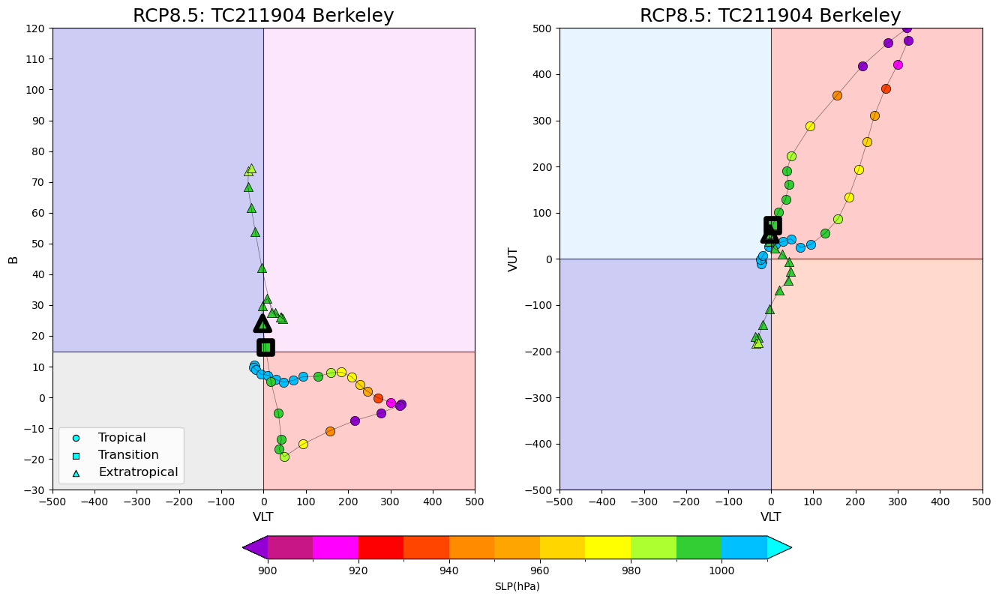

In [43]:
# Input Code
Code = 'TC211904'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 1, True, "RCP8.5", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

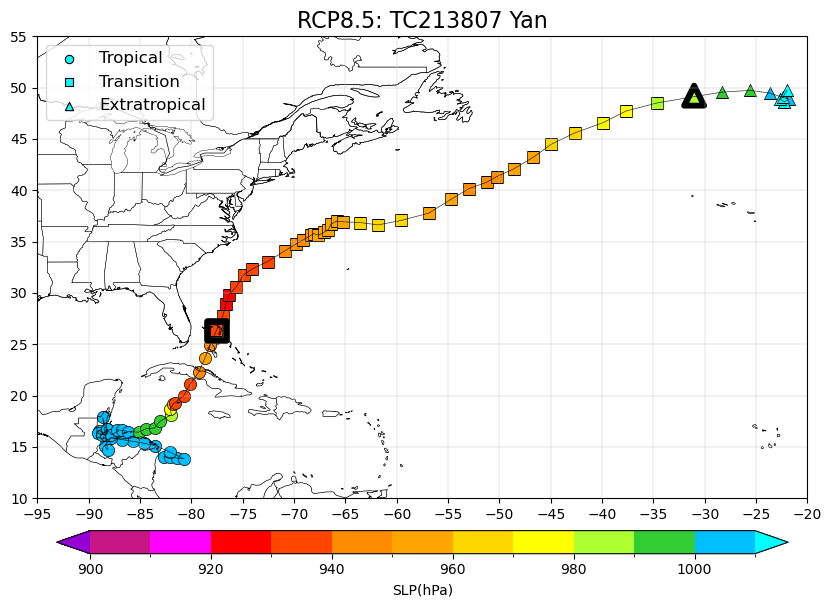

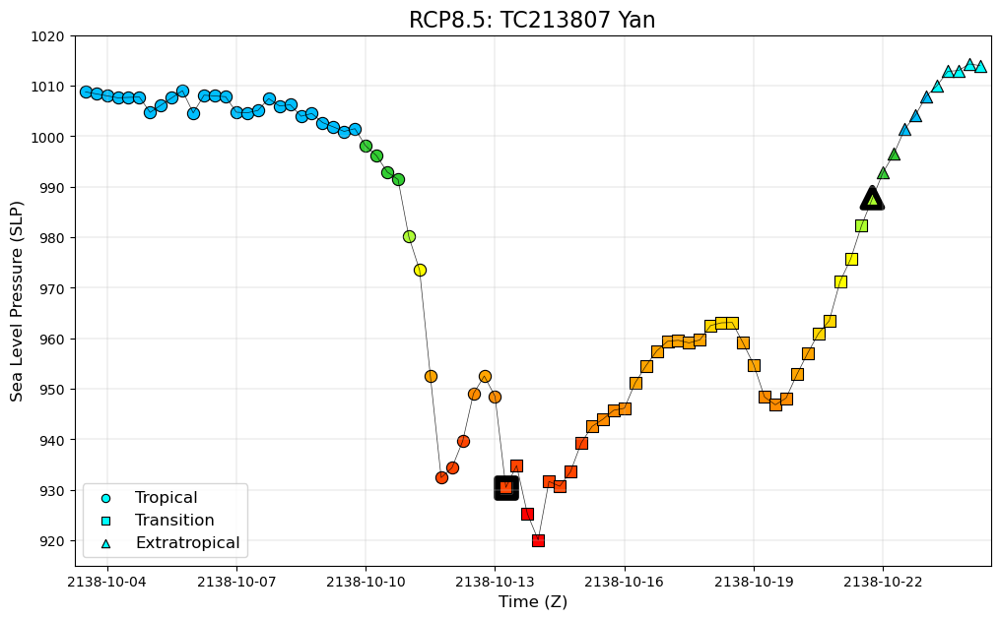

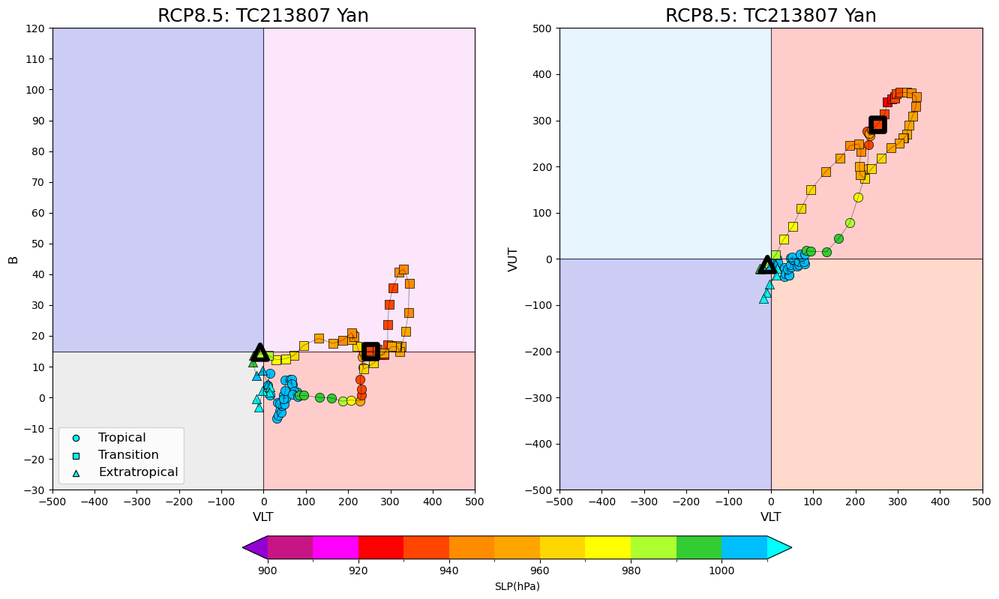

In [44]:
# Input Code
Code = 'TC213807'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (10,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

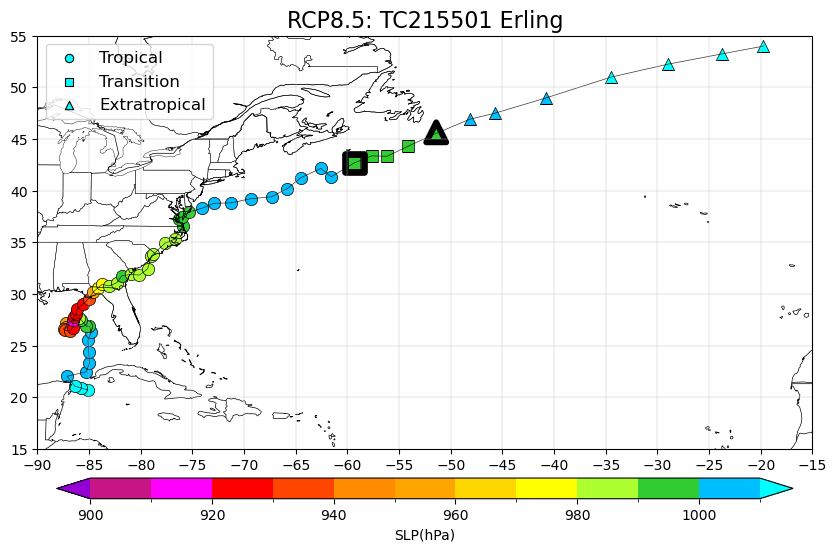

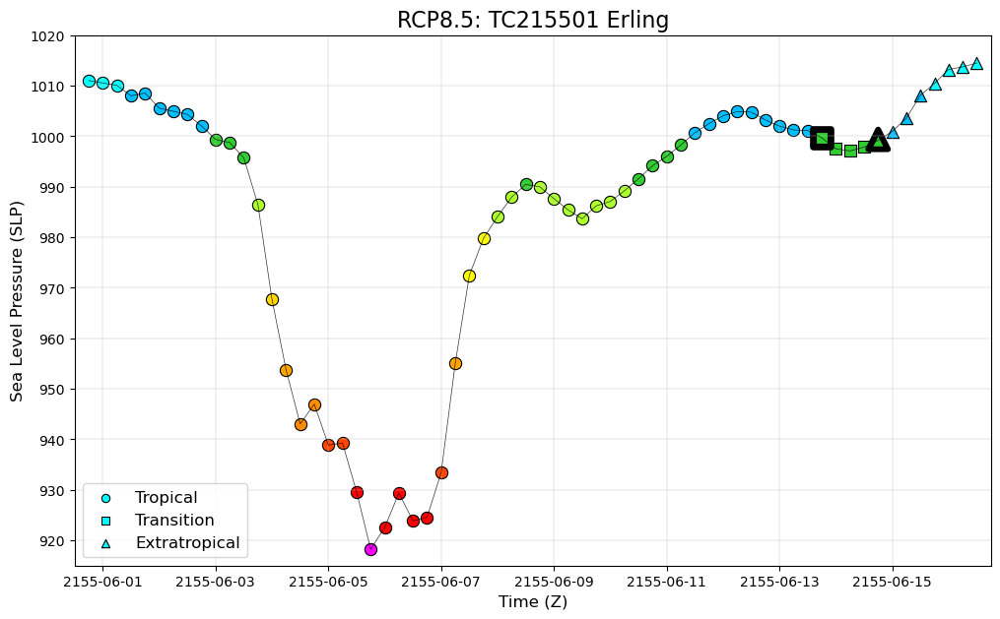

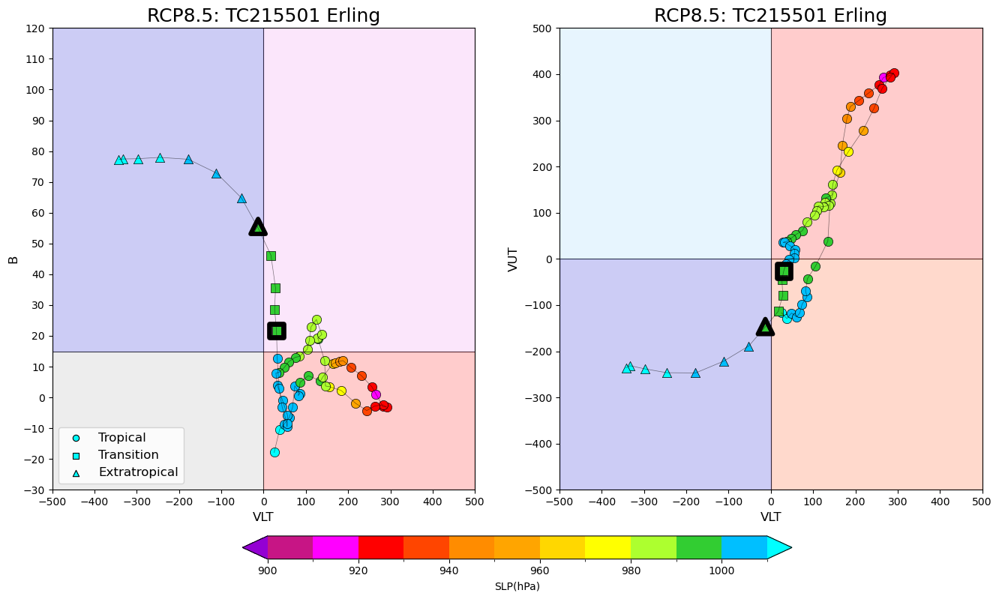

In [45]:
# Input Code
Code = 'TC215501'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (10,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

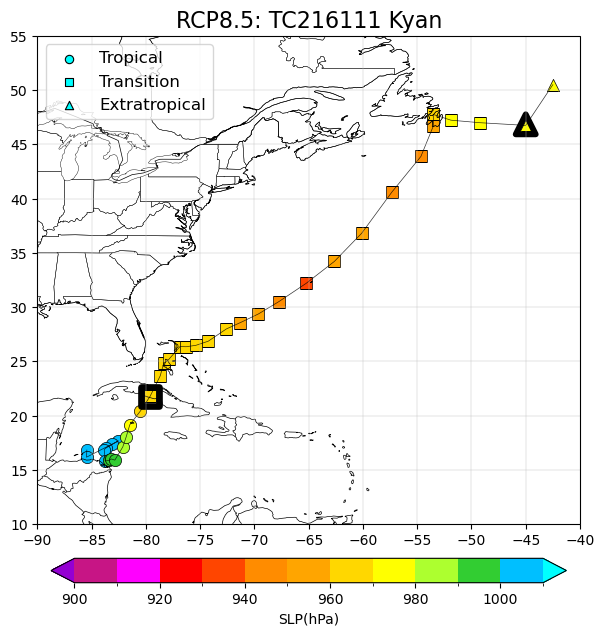

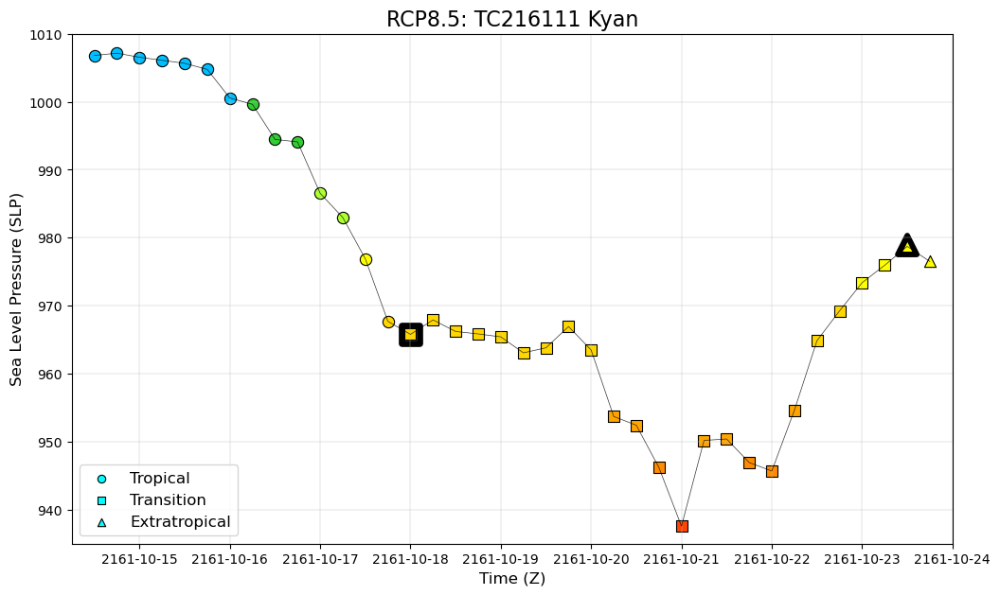

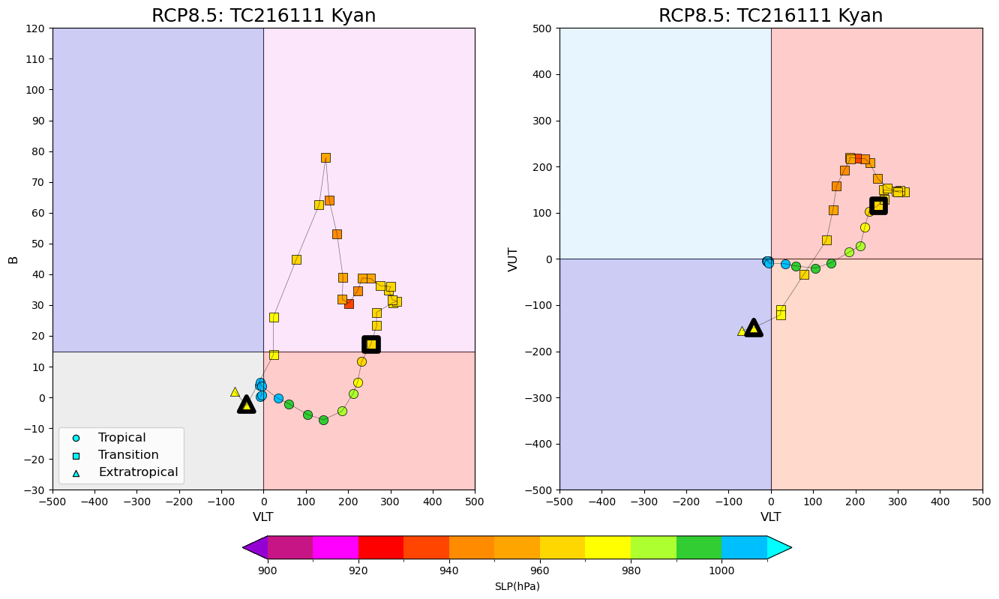

In [46]:
# Input Code
Code = 'TC216111'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

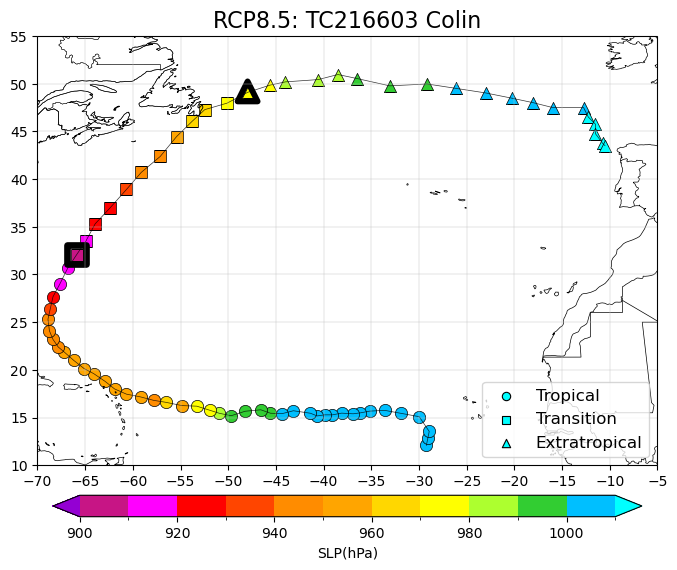

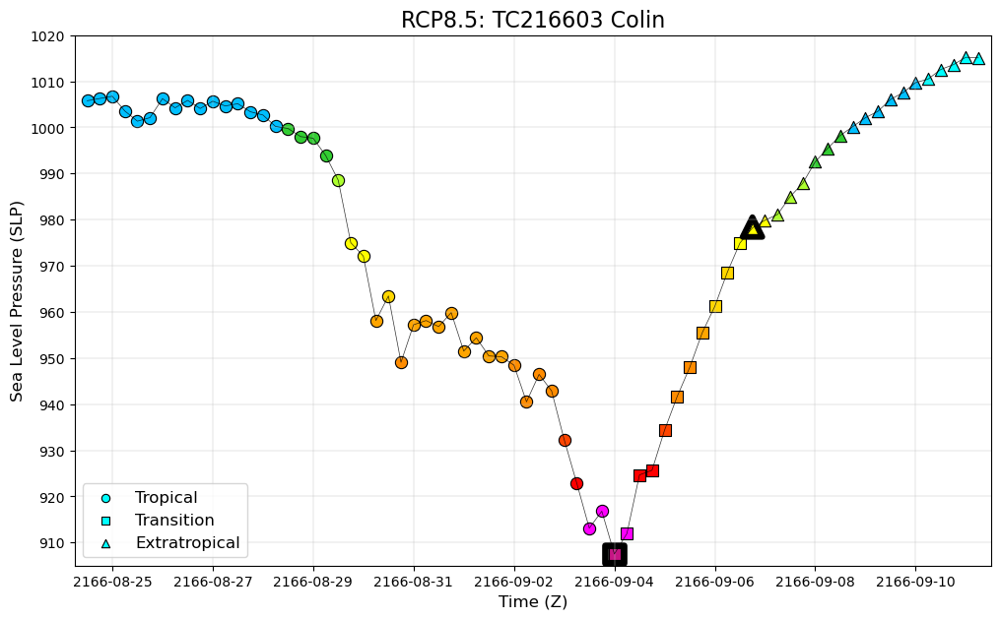

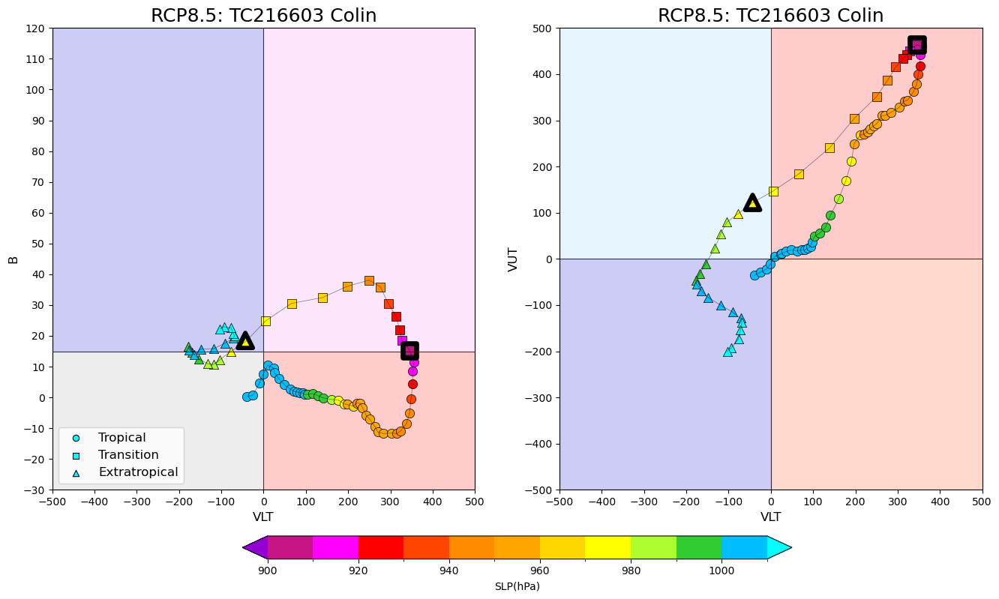

In [47]:
# Input Code
Code = 'TC216603'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP8.5", True, (8,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

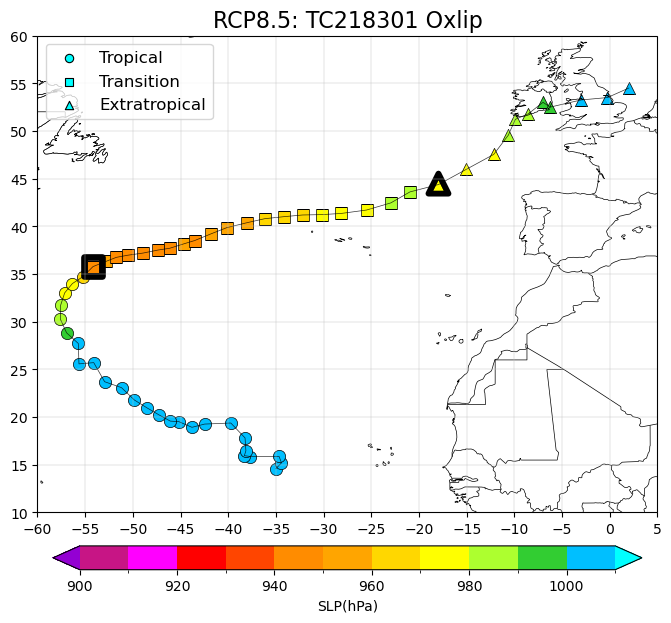

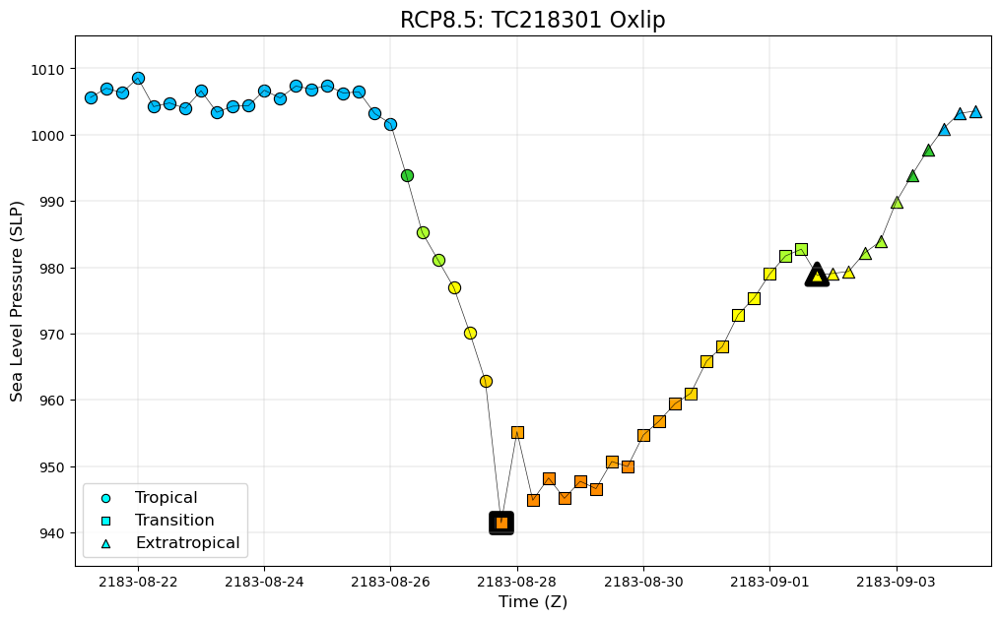

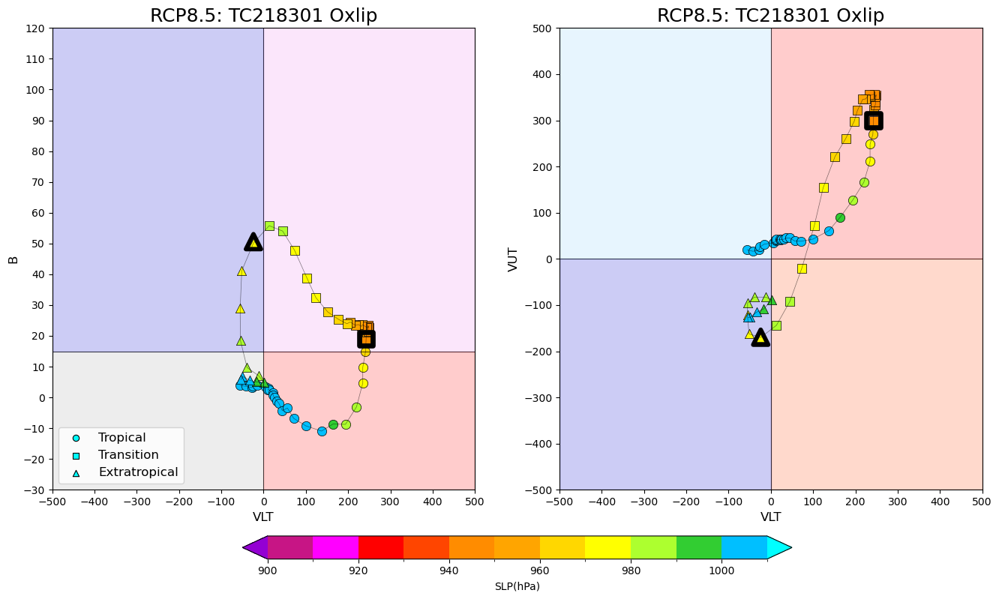

In [48]:
# Input Code
Code = 'TC218301'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (8,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

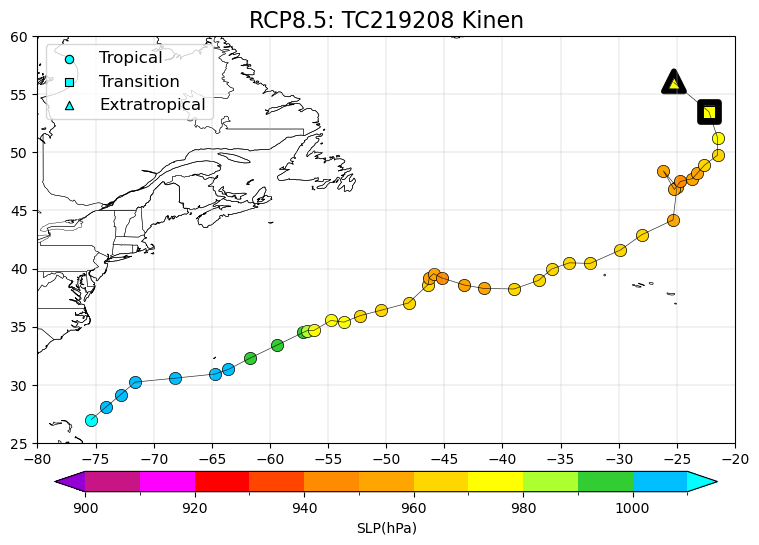

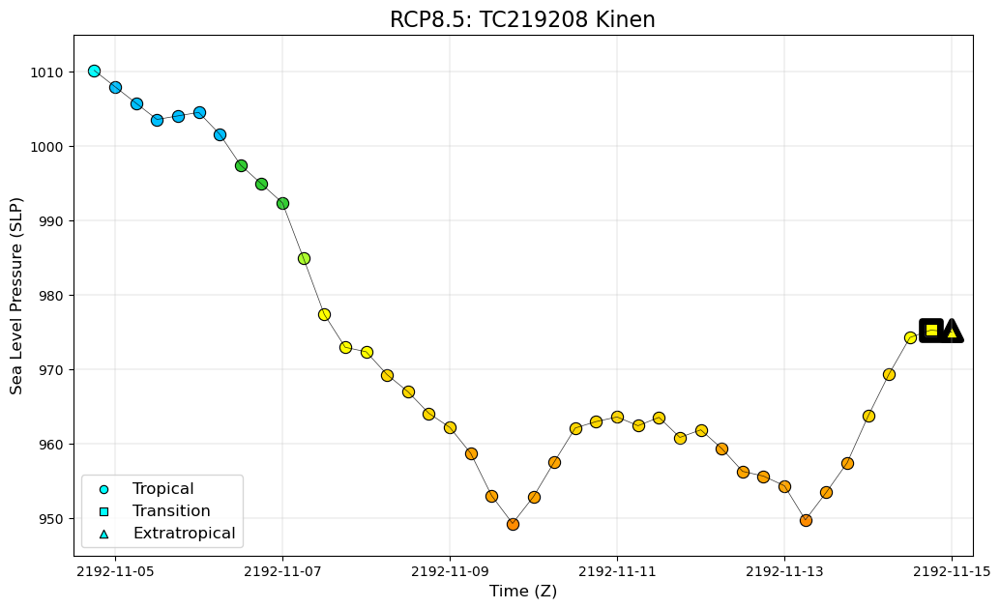

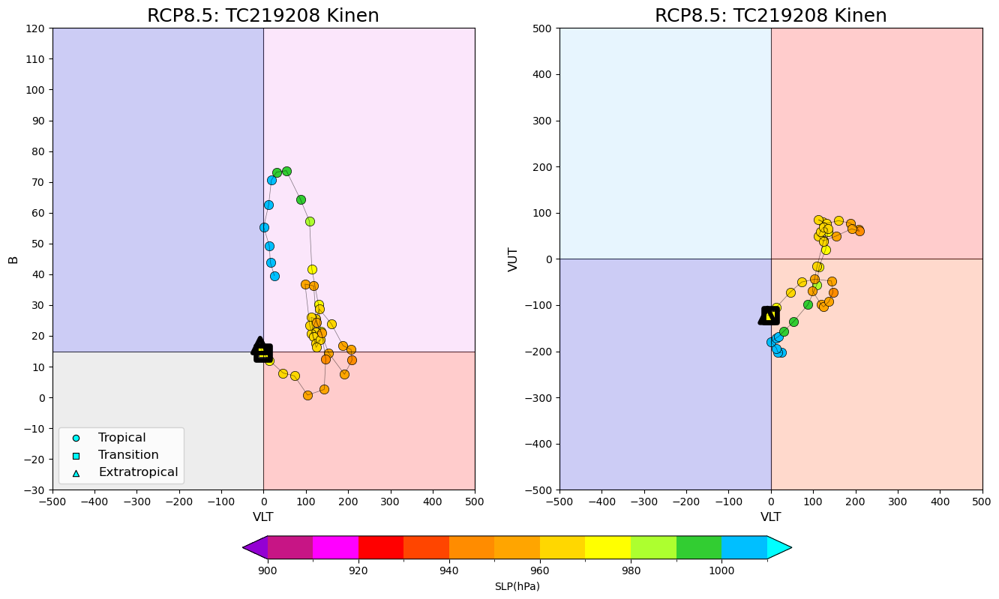

In [49]:
# Input Code
Code = 'TC219208'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (9,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

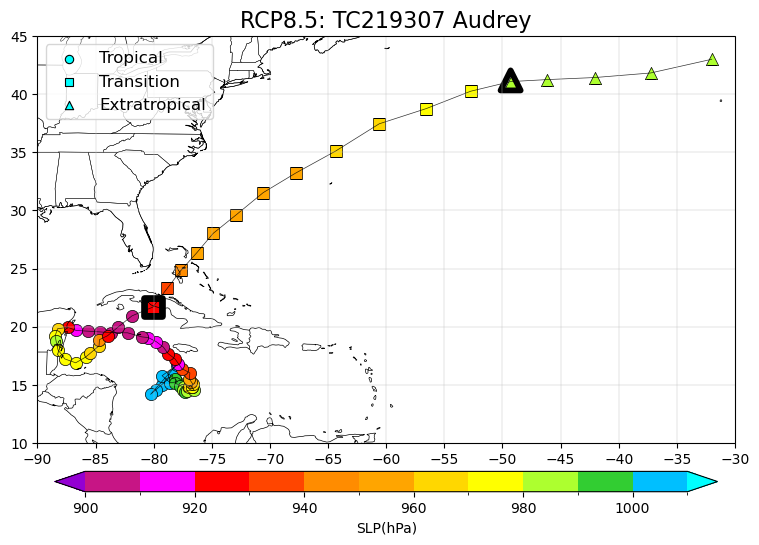

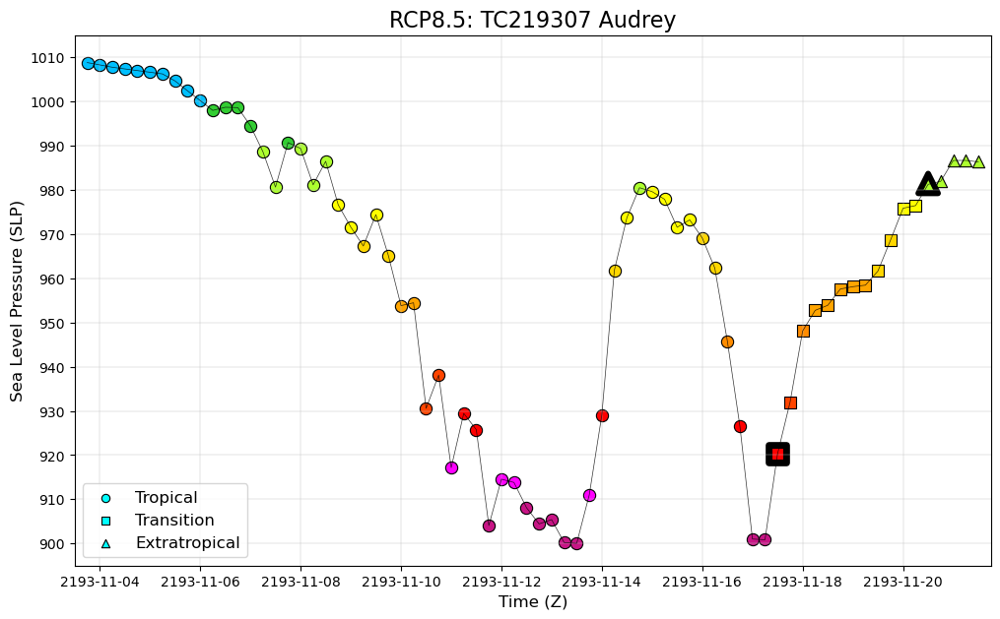

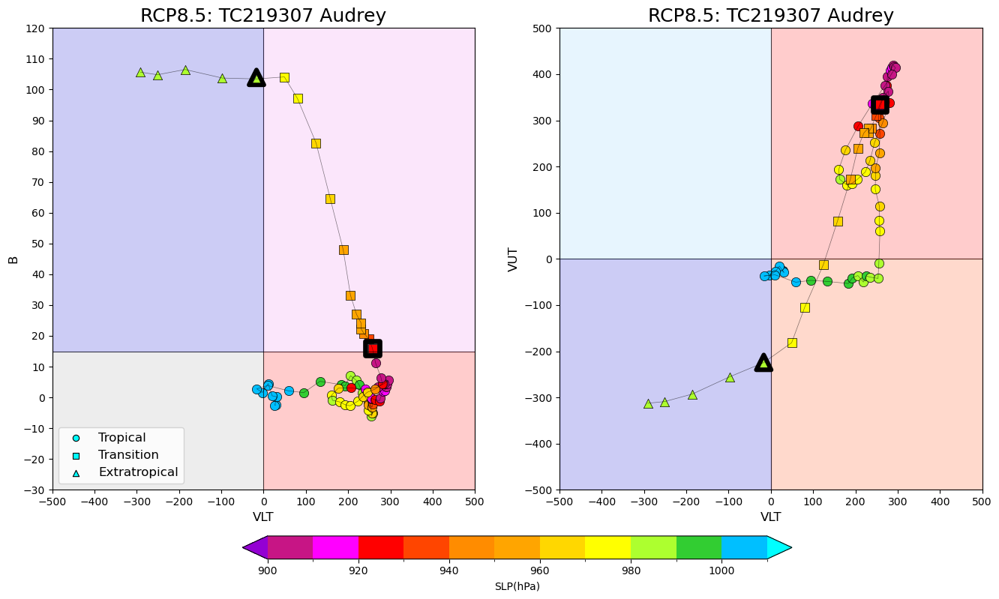

In [50]:
# Input Code
Code = 'TC219307'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", True, (9,6))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", True)

In [51]:
# Input Code
#Code = 'TC198412'
#Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 2, True, "Control", False, (7,7))
#Plot_Cyclone_SLP(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", False)
#Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", False)

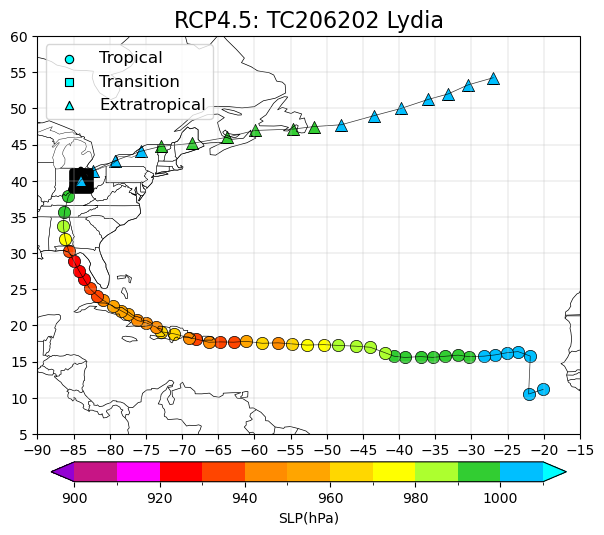

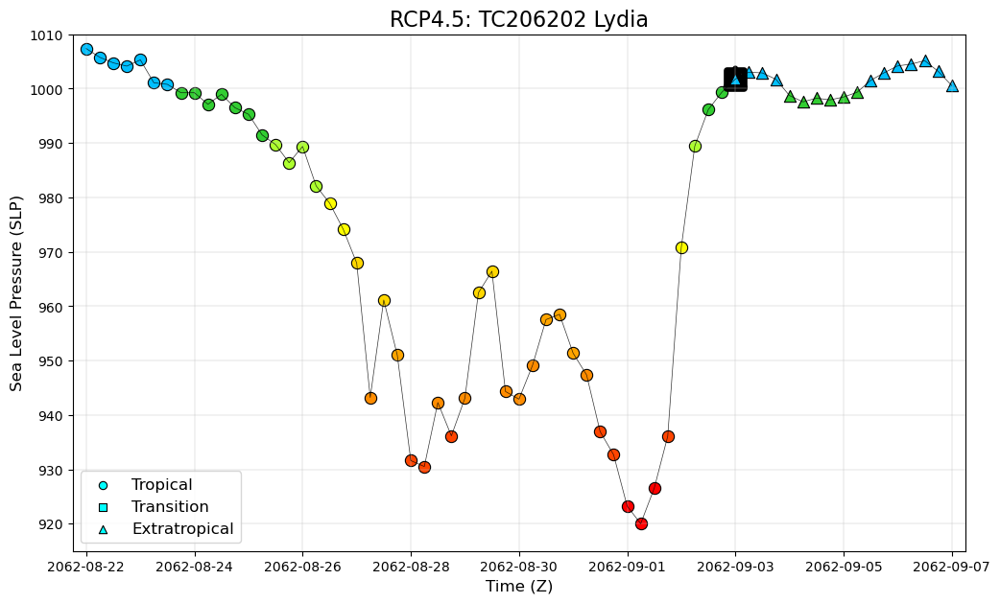

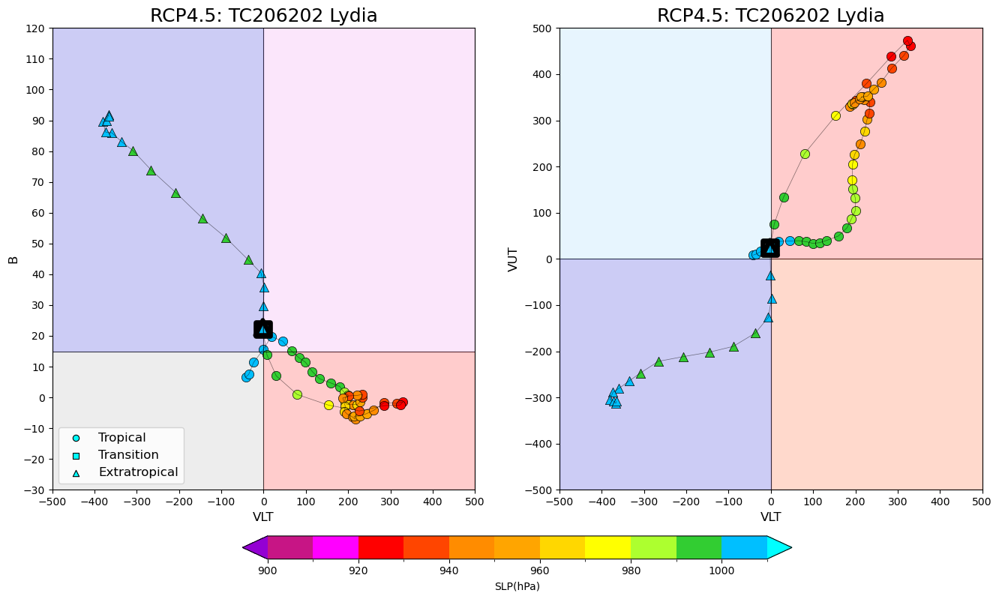

In [52]:
# Input Code
Code = 'TC206202'
Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP4.5", False, (7,7))
Plot_Cyclone_SLP(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", False)
Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", False)

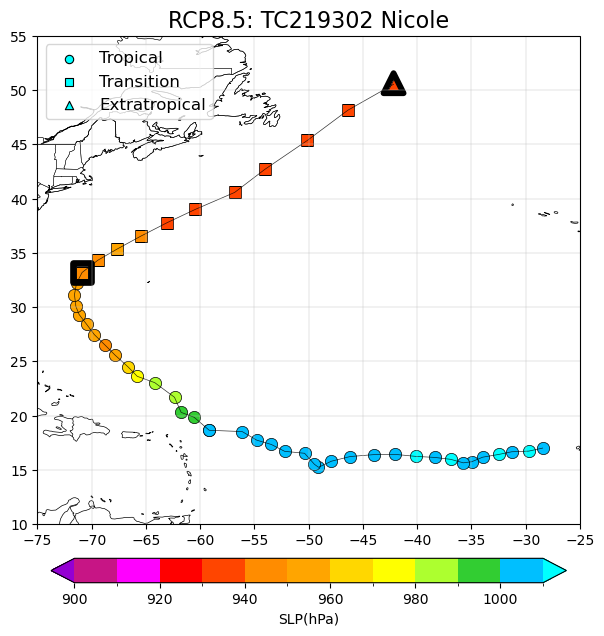

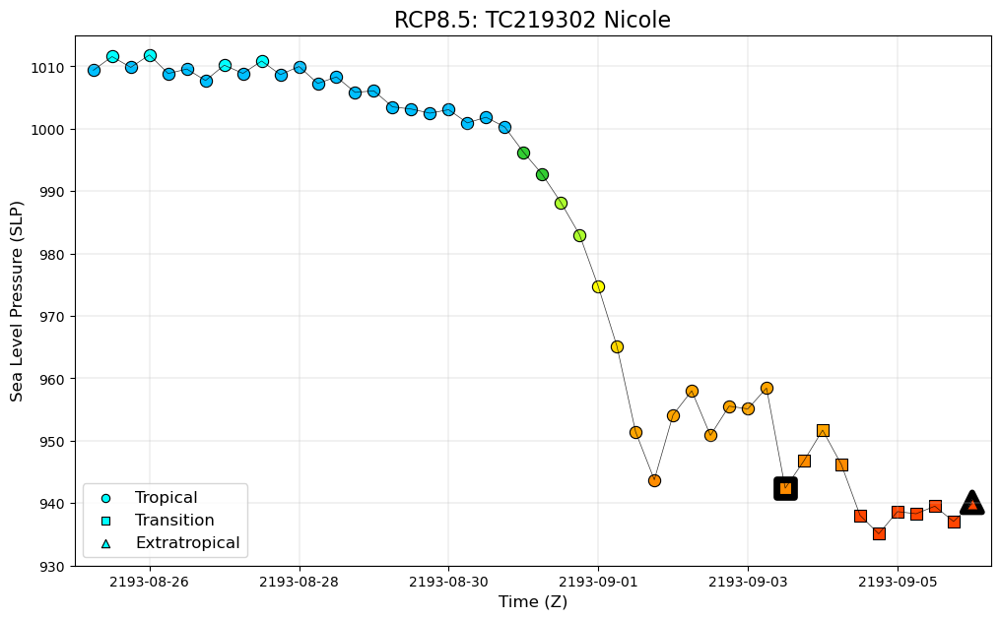

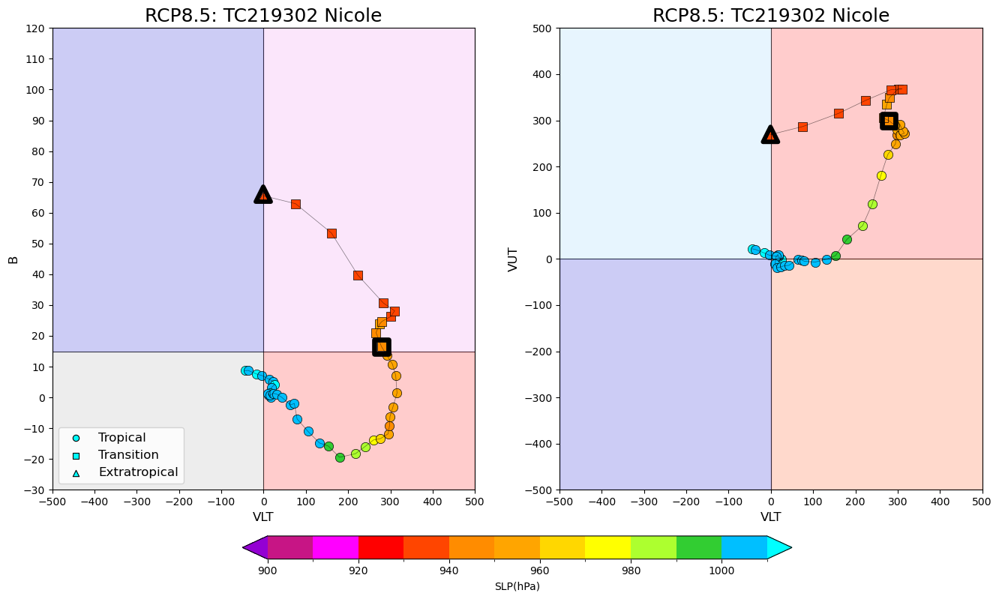

In [53]:
# Input Code
Code = 'TC219302'
Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 2, True, "RCP8.5", False, (7,7))
Plot_Cyclone_SLP(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", False)
Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", False)

In [54]:
# Input Code
#for i in range(len(Control_ET)):
#    Code = Control_ET["Code"][i]
#    if i >= 420 and i < 440:
#        Plot_Cyclone_Track(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 4, True, "Control", False, (7,7))
#        Plot_Cyclone_Phase(Code, Control_Data, Control_ET, SLP_Bounds, SLP_Colours, 3, True, "Control", False)

In [55]:
# Input Code
#for i in range(len(RCP45_ET)):
#    Code = RCP45_ET["Code"][i]
#    if i >= 200 and i < 220:
#        Plot_Cyclone_Track(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP4.5", False, (7,7))
#        Plot_Cyclone_Phase(Code, RCP45_Data, RCP45_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP4.5", False)

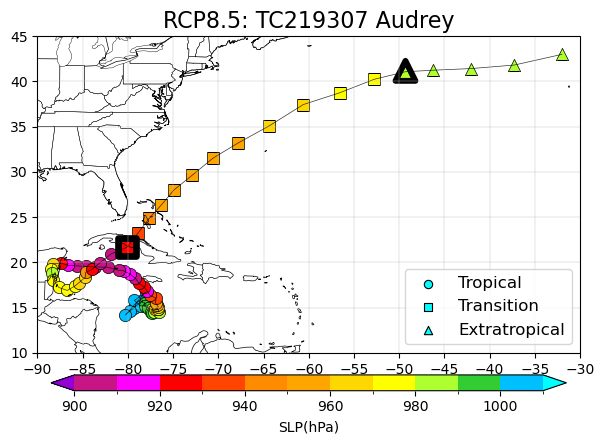

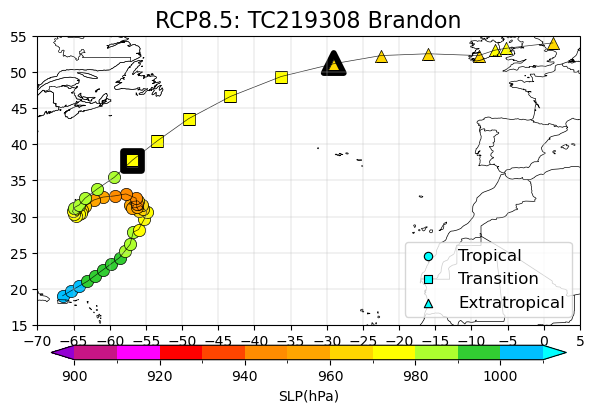

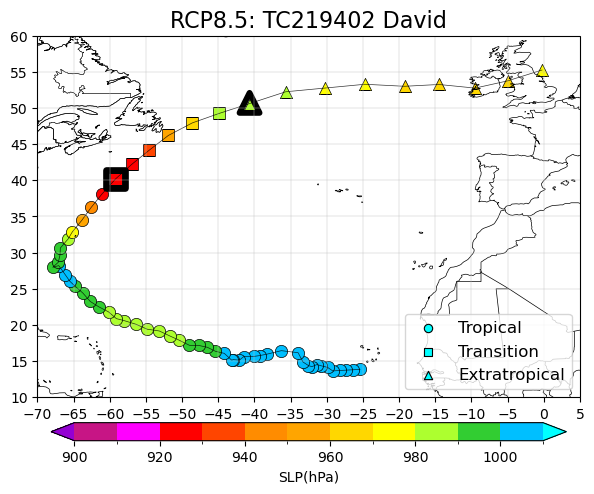

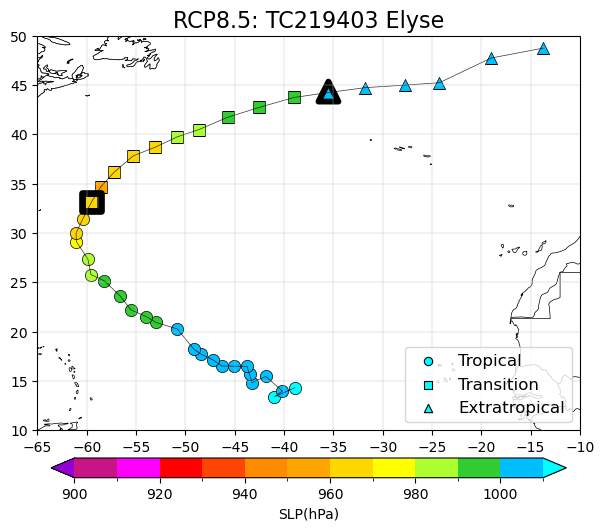

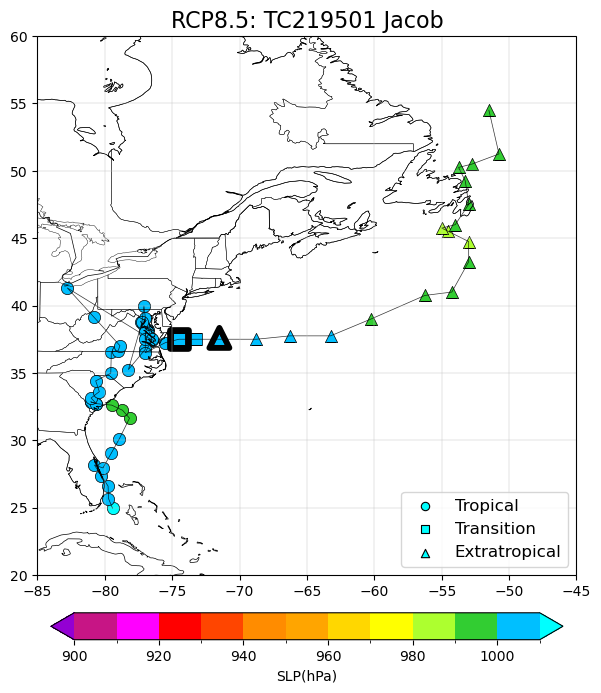

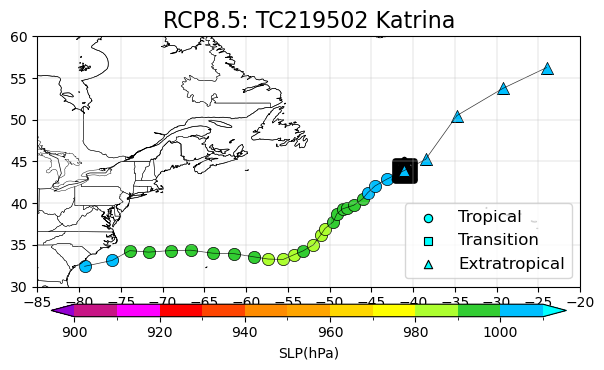

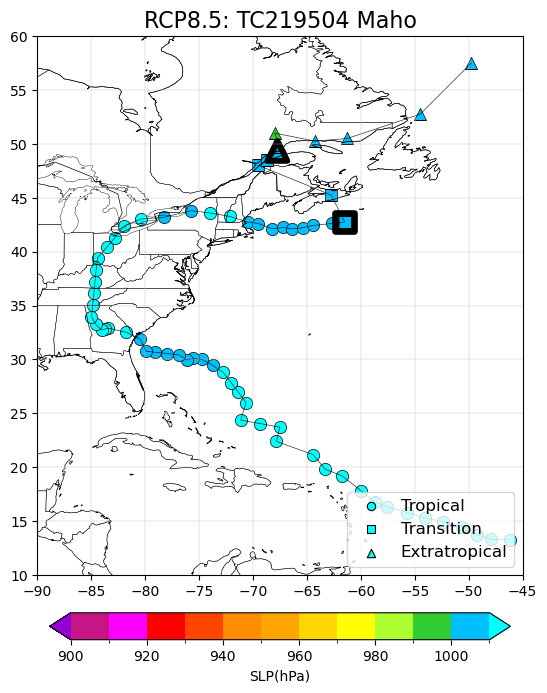

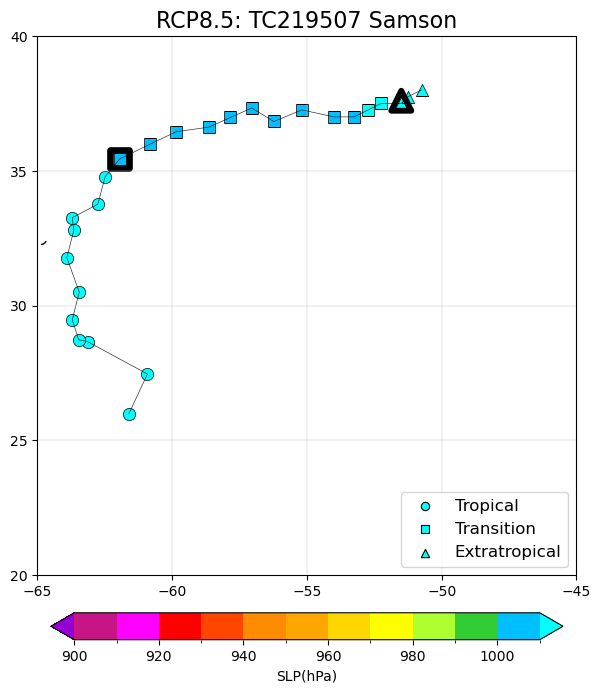

In [56]:
# Input Code
for i in range(len(RCP85_ET)):
    Code = RCP85_ET["Code"][i]
    if i >= 280 and i < 300:
        Plot_Cyclone_Track(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 4, True, "RCP8.5", False, (7,7))
#        Plot_Cyclone_Phase(Code, RCP85_Data, RCP85_ET, SLP_Bounds, SLP_Colours, 3, True, "RCP8.5", False)

In [57]:
Control_ET[Control_ET["Name"] == "Kinen"]

,Code,Name,Path Type,Start Time,End Time,Min SLP,Start SLP,End SLP,Start Lon,Start Lat,End Lon,End Lat,ET Dist (km),ET Duration (hr),Trop Duration (hr)
285,TC196102,Kinen,2,1961-09-12 18:00:00,1961-09-13 18:00:00,1009.95,1016.44,1016.16,-47.4,31.99,-44.24,34.82,430.529482,24.0,96.0


In [58]:
RCP45_ET[RCP45_ET["Name"] == "Kinen"]

,Code,Name,Path Type,Start Time,End Time,Min SLP,Start SLP,End SLP,Start Lon,Start Lat,End Lon,End Lat,ET Dist (km),ET Duration (hr),Trop Duration (hr)
65,TC202102,Kinen,1,2021-02-22 06:00:00,2021-02-22 12:00:00,977.86,1000.79,1002.41,-45.24,32.38,-43.72,31.59,168.307360,6.0,72.0
140,TC204108,Kinen,2,2041-11-28 06:00:00,2041-11-28 18:00:00,943.09,991.80,991.47,-65.38,32.76,-60.83,32.50,427.420546,12.0,96.0
196,TC206201,Kinen,2,2062-08-06 00:00:00,2062-08-06 18:00:00,962.74,1001.11,998.49,-81.87,39.96,-73.60,45.07,883.928432,18.0,426.0
255,TC208003,Kinen,2,2080-09-26 18:00:00,2080-09-27 00:00:00,1001.01,1004.85,1002.95,-48.25,37.25,-48.00,41.25,445.698246,6.0,294.0


In [59]:
RCP85_ET[RCP85_ET["Name"] == "Kinen"]

,Code,Name,Path Type,Start Time,End Time,Min SLP,Start SLP,End SLP,Start Lon,Start Lat,End Lon,End Lat,ET Dist (km),ET Duration (hr),Trop Duration (hr)
66,TC212406,Kinen,3,2124-09-24 00:00:00,2124-09-24,945.58,990.11,990.11,-25.67,48.72,-25.67,48.72,0.000000,0.0,222.0
210,TC216704,Kinen,1,2167-05-24 00:00:00,2167-05-25,991.73,996.85,1004.13,-72.24,37.55,-67.03,44.79,915.310127,24.0,90.0
274,TC219208,Kinen,2,2192-11-14 18:00:00,2192-11-15,949.31,975.29,975.02,-22.25,53.50,-25.25,56.00,338.409672,6.0,240.0
